# Chicago Traffic Crashes

In [2]:
# importing necessary libraries
import pandas as pd
import numpy as np
from scipy import stats
from textwrap import wrap

from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
from matplotlib import ticker
%matplotlib inline

pd.options.mode.chained_assignment = None

import seaborn as sns
color = sns.color_palette()
plt.style.use('seaborn-notebook')
from yellowbrick.regressor import ResidualsPlot
import statsmodels.api as sm
from statsmodels.api import OLS
import geopandas as gpd
from shapely.geometry import Point, Polygon

from pandas_profiling import ProfileReport
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import Ridge, LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split, cross_validate, KFold, cross_val_score, GridSearchCV
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures, OrdinalEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.metrics import mean_squared_error, make_scorer, r2_score, mean_absolute_error, plot_confusion_matrix, recall_score, accuracy_score, precision_score, f1_score
from matplotlib import pyplot as plt

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImPipeline

### Import Data

In [3]:
# import merged csv
df = pd.read_csv('./data/merged_chicago.csv')
print(df.shape)
df.head()

(187036, 43)


,CRASH_RECORD_ID,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,...,VEHICLE_ID,MAKE,MODEL,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT
0,79e41eed98374f851142153e5755cf25e1cb0b90272297...,15.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,PARKING LOT,STRAIGHT AND LEVEL,DRY,...,1085576.0,CHEVROLET,MALIBU,2018.0,UNKNOWN,PASSENGER,PERSONAL,PARKED,0.0,ROOF
1,79a9c11b06e5d529811576e6d109e250056fb31724b246...,30.0,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,25.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,...,1144872.0,MITSUBISHI,ECLIPSE,2019.0,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,PASSING/OVERTAKING,1.0,REAR-RIGHT
3,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,25.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,...,1144885.0,HONDA,CR-V,2013.0,NONE,PASSENGER,PERSONAL,STRAIGHT AHEAD,1.0,SIDE-RIGHT
4,7bf1fa2ab7bfc4a859cde9f60855597d70e21ea33cf2a7...,30.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,REAR TO FRONT,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,...,1098569.0,VOLKSWAGEN,PASSAT,2014.0,NONE,PASSENGER,PERSONAL,BACKING,1.0,REAR-LEFT


In [4]:
# viewing columns, # of columns, column dtypes, # of rows, # of non nulls
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187036 entries, 0 to 187035
Data columns (total 43 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   CRASH_RECORD_ID                187036 non-null  object 
 1   POSTED_SPEED_LIMIT             187036 non-null  float64
 2   TRAFFIC_CONTROL_DEVICE         187036 non-null  object 
 3   DEVICE_CONDITION               187036 non-null  object 
 4   WEATHER_CONDITION              187036 non-null  object 
 5   LIGHTING_CONDITION             187036 non-null  object 
 6   FIRST_CRASH_TYPE               187036 non-null  object 
 7   TRAFFICWAY_TYPE                187036 non-null  object 
 8   ALIGNMENT                      187036 non-null  object 
 9   ROADWAY_SURFACE_COND           187036 non-null  object 
 10  ROAD_DEFECT                    187036 non-null  object 
 11  CRASH_TYPE                     187036 non-null  object 
 12  PRIM_CONTRIBUTORY_CAUSE       

### Identify/Clean Target

We are predicting features involved in a car crash that are likely to result in an incident with injury 

In [5]:
# inspecting value_counts of possible target columns using for loop 
columns=['CRASH_TYPE', 'MOST_SEVERE_INJURY', 'INJURIES_TOTAL', 'INJURIES_FATAL','INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING', 'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION', 'INJURIES_UNKNOWN']
for i in columns:
    print(i) 
    print('\n')
    try:
        print(df[i].value_counts(dropna=False)[:10])
    except: 
        print(df[i].value_counts(dropna=False))
    print('_________________________________________________________________')

CRASH_TYPE


NO INJURY / DRIVE AWAY              126291
INJURY AND / OR TOW DUE TO CRASH     60745
Name: CRASH_TYPE, dtype: int64
_________________________________________________________________
MOST_SEVERE_INJURY


NO INDICATION OF INJURY     157550
NONINCAPACITATING INJURY     16923
REPORTED, NOT EVIDENT         8615
INCAPACITATING INJURY         3304
NaN                            408
FATAL                          236
Name: MOST_SEVERE_INJURY, dtype: int64
_________________________________________________________________
INJURIES_TOTAL


0.0     157550
1.0      20764
2.0       5485
3.0       1870
4.0        608
NaN        408
5.0        206
6.0         87
7.0         23
8.0         19
9.0          9
11.0         3
21.0         2
15.0         2
Name: INJURIES_TOTAL, dtype: int64
_________________________________________________________________
INJURIES_FATAL


0.0    186392
NaN       408
1.0       211
2.0        23
3.0         2
Name: INJURIES_FATAL, dtype: int64
__________________

In [6]:
# dropping columns that will not serve as target and are redundant
# dropping 'CRASH_TYPE' column as it contains a binary that factors in inanimate damage. we are not interested in predicting incidents that involve only car damage.
drop = ['CRASH_TYPE', 'INJURIES_FATAL','INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING', 'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION', 'INJURIES_UNKNOWN']

df = df.drop(columns = drop)
print(df.shape)

(187036, 36)


In [7]:
# confirming how 'MOST_SEVERE_INJURY' == 'FATAL' is reflected in 'INJURIES_TOTAL' column values
df.loc[df['MOST_SEVERE_INJURY'] == 'FATAL']

,CRASH_RECORD_ID,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,...,VEHICLE_ID,MAKE,MODEL,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT
246,7b48c97118961992500a9e2e29be06395ec3bde97554a5...,45.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,FIXED OBJECT,DIVIDED - W/MEDIAN BARRIER,STRAIGHT AND LEVEL,DRY,...,1195202.0,TOYOTA,CAMRY,2007.0,UNKNOWN,PASSENGER,PERSONAL,STRAIGHT AHEAD,1.0,OTHER
1308,78e8db63b33e9ee8901ad756e3f4419da9d1a42eca960d...,30.0,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,DIVIDED - W/MEDIAN BARRIER,STRAIGHT AND LEVEL,DRY,...,1137318.0,FORD,WINDSTAR,2002.0,NONE,VAN/MINI-VAN,NOT IN USE,PARKED,0.0,REAR-LEFT
1309,78e8db63b33e9ee8901ad756e3f4419da9d1a42eca960d...,30.0,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,DIVIDED - W/MEDIAN BARRIER,STRAIGHT AND LEVEL,DRY,...,1137315.0,JEEP,COMPASS,2020.0,UNKNOWN,PASSENGER,PERSONAL,OTHER,2.0,OTHER
1310,78e8db63b33e9ee8901ad756e3f4419da9d1a42eca960d...,30.0,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,DIVIDED - W/MEDIAN BARRIER,STRAIGHT AND LEVEL,DRY,...,1137317.0,CHRYSLER,300,2007.0,NONE,PASSENGER,NOT IN USE,PARKED,0.0,SIDE-LEFT
3019,7f2ce9c729950c40771fde3046a8d19d00844496df0950...,30.0,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,PEDESTRIAN,DIVIDED - W/MEDIAN BARRIER,STRAIGHT AND LEVEL,DRY,...,1268370.0,BMW,600,2017.0,UNKNOWN,PASSENGER,PERSONAL,CHANGING LANES,1.0,OTHER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185010,fec9f103b080d0c74782ee4f19b500b95ca3a665546260...,30.0,NO CONTROLS,NO CONTROLS,BLOWING SNOW,DAYLIGHT,SIDESWIPE SAME DIRECTION,DIVIDED - W/MEDIAN (NOT RAISED),STRAIGHT AND LEVEL,SNOW OR SLUSH,...,1210099.0,FORD,F150,2005.0,NONE,PICKUP,PERSONAL,STRAIGHT AHEAD,1.0,SIDE-RIGHT
185011,fec9f103b080d0c74782ee4f19b500b95ca3a665546260...,30.0,NO CONTROLS,NO CONTROLS,BLOWING SNOW,DAYLIGHT,SIDESWIPE SAME DIRECTION,DIVIDED - W/MEDIAN (NOT RAISED),STRAIGHT AND LEVEL,SNOW OR SLUSH,...,1210108.0,TOYOTA,COROLLA,2015.0,NONE,PASSENGER,OTHER,STRAIGHT AHEAD,1.0,FRONT-LEFT
186417,fdc6c426e3239c342076a256fdeb23713036507188c488...,30.0,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",HEAD ON,NOT DIVIDED,STRAIGHT AND LEVEL,WET,...,1100385.0,FORD,TAURUS,2012.0,UNKNOWN,UNKNOWN/NA,PERSONAL,UNKNOWN/NA,1.0,OTHER
186418,fdc6c426e3239c342076a256fdeb23713036507188c488...,30.0,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",HEAD ON,NOT DIVIDED,STRAIGHT AND LEVEL,WET,...,1100386.0,FORD,EXPLORER,2011.0,UNKNOWN,PASSENGER,PERSONAL,UNKNOWN/NA,2.0,OTHER


In [8]:
# focus on possible target 'Most Severe Injury'
df['MOST_SEVERE_INJURY'].value_counts(dropna=False)

NO INDICATION OF INJURY     157550
NONINCAPACITATING INJURY     16923
REPORTED, NOT EVIDENT         8615
INCAPACITATING INJURY         3304
NaN                            408
FATAL                          236
Name: MOST_SEVERE_INJURY, dtype: int64

In [9]:
# focus on possible target 'Injuries Total'
df['INJURIES_TOTAL'].value_counts(dropna=False)

0.0     157550
1.0      20764
2.0       5485
3.0       1870
4.0        608
NaN        408
5.0        206
6.0         87
7.0         23
8.0         19
9.0          9
11.0         3
21.0         2
15.0         2
Name: INJURIES_TOTAL, dtype: int64

Because our target is to predict incidents with injury not severity we do not need information on level of severity. Both possible target columns contain same number of 'no injuries' and 'NaN' values. 'MOST_SEVERE_INJURY' column creates distinction between 'NONINCAPACITATING INJURY', 'REPORTED, NOT EVIDENT', and 'INCAPACITATING INJURY', whereas 'INJURIES_TOTAL' column only accounts for number of injuries. Will reorganize 'INJURIES_TOTAL' into binary column to show whether the crash incident resulted in an injury or not.

In [10]:
# dropping MOST_SEVERE_INJURY column for redundancy as those injury values are reflected in INJURIES_TOTAL column
df = df.drop(columns='MOST_SEVERE_INJURY')
print(df.shape)

(187036, 35)


Choosing not to fill in nulls. It is important to make predictions based off of real data given its possible impact to street safety.

In [11]:
# dropping target nulls
df = df.dropna(subset=['INJURIES_TOTAL']).copy()
print(df.shape)

(186628, 35)


In [12]:
# confirming null values are dropped
df['INJURIES_TOTAL'].value_counts(dropna=False)

0.0     157550
1.0      20764
2.0       5485
3.0       1870
4.0        608
5.0        206
6.0         87
7.0         23
8.0         19
9.0          9
11.0         3
21.0         2
15.0         2
Name: INJURIES_TOTAL, dtype: int64

In [13]:
# creating new column to create a binary outcome of either an incident with injury or an incident with no injury
df.rename(columns = {'INJURIES_TOTAL': 'Incident with Injury'}, inplace=True)
df['Incident with Injury'] = df['Incident with Injury'].map(lambda x:0 if x == 0.0 else 1)

In [14]:
# confirming binary values for target
df['Incident with Injury'].value_counts(dropna=False, normalize=True)

0    0.844193
1    0.155807
Name: Incident with Injury, dtype: float64

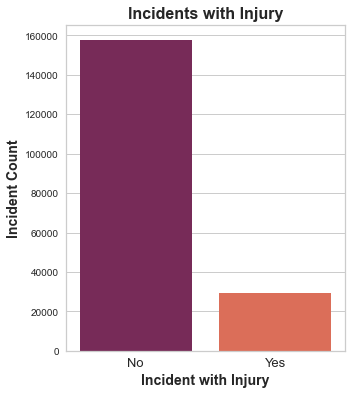

In [15]:
# plotting incidents with injury v incidents with no injury
plt.figure(figsize=(5,6))
sns.countplot(x=df['Incident with Injury'], 
              data=df, 
              palette='rocket').set_xticklabels(['No','Yes'], fontsize=13)
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count',  weight='bold', fontsize=14)
plt.title('Incidents with Injury', weight='bold', size=16)
plt.savefig('Incidents with Injury.jpg', dpi=400);

### Handling Nulls

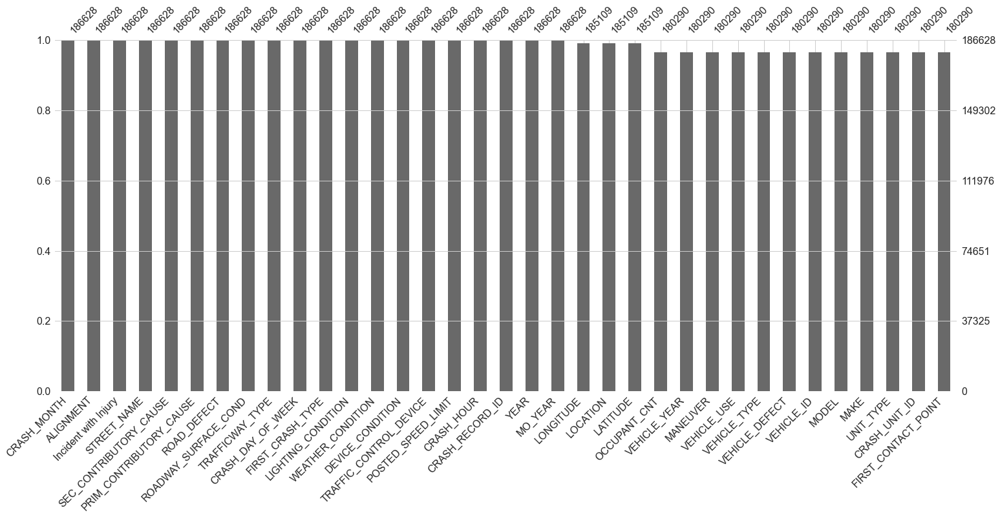

In [17]:
# bar chart for null observation
import missingno as msno
msno.bar(df, sort='descending');

In [18]:
# viewing columns, # of columns, dtypes, # of rows, # of non nulls
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 186628 entries, 0 to 187035
Data columns (total 35 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   CRASH_RECORD_ID          186628 non-null  object 
 1   POSTED_SPEED_LIMIT       186628 non-null  float64
 2   TRAFFIC_CONTROL_DEVICE   186628 non-null  object 
 3   DEVICE_CONDITION         186628 non-null  object 
 4   WEATHER_CONDITION        186628 non-null  object 
 5   LIGHTING_CONDITION       186628 non-null  object 
 6   FIRST_CRASH_TYPE         186628 non-null  object 
 7   TRAFFICWAY_TYPE          186628 non-null  object 
 8   ALIGNMENT                186628 non-null  object 
 9   ROADWAY_SURFACE_COND     186628 non-null  object 
 10  ROAD_DEFECT              186628 non-null  object 
 11  PRIM_CONTRIBUTORY_CAUSE  186628 non-null  object 
 12  SEC_CONTRIBUTORY_CAUSE   186628 non-null  object 
 13  STREET_NAME              186628 non-null  object 
 14  Inci

### Identify/Explore Features

#### CRASH_RECORD_ID
 - "This number can be used to link to the same crash in the Vehicles and People datasets. This number also serves as a unique ID in this dataset."<br>

#### CRASH_UNIT_ID
 - 	"A unique identifier for each vehicle record." <br>

####  VEHICLE_ID
 - "The corresponding CRASH_UNIT_ID from the Vehicles dataset."

In [19]:
# dropping columns. unique identifiers for merging datasets and filtering out duplicates are no longer needed. 
# 'YEAR' column no longer needed, data only from July 2021 - June 2022.
drop_columns = ['CRASH_RECORD_ID', 'CRASH_UNIT_ID', 'VEHICLE_ID', 'YEAR']
df.drop(drop_columns, axis=1, inplace=True)
df.shape

(186628, 31)

#### POSTED_SPEED_LIMIT
 - "Posted speed limit, as determined by reporting officer"

In [20]:
# checking column values and remaining nulls
df['POSTED_SPEED_LIMIT'].value_counts(dropna=False)

30.0    138778
35.0     12240
25.0     12088
20.0      8106
15.0      6178
10.0      4543
40.0      1995
45.0      1422
5.0        536
0.0        361
55.0       186
50.0        56
3.0         47
39.0        21
24.0        18
60.0        14
2.0          6
7.0          5
11.0         4
34.0         4
9.0          3
4.0          3
29.0         2
62.0         2
33.0         2
32.0         2
1.0          2
12.0         2
38.0         1
70.0         1
Name: POSTED_SPEED_LIMIT, dtype: int64

In [21]:
# creating new column with bins and label
df['SPEED_LIMIT'] = pd.cut(x=df['POSTED_SPEED_LIMIT'], 
                           bins=[-1,10,25,40,55,70], 
                           labels=['0 - 10','11 - 25','26 - 40','41 - 55','56 - 70'])
print(df.shape)
df.head(3)

(186628, 32)


,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NAME,Incident with Injury,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,MO_YEAR,UNIT_TYPE,MAKE,MODEL,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT,SPEED_LIMIT
0,15.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,PARKING LOT,STRAIGHT AND LEVEL,DRY,NO DEFECTS,UNABLE TO DETERMINE,NOT APPLICABLE,CENTRAL AVE,0,14.0,4.0,7.0,41.925893,-87.766205,POINT (-87.766204825838 41.925892880213),2021-07-21,PARKED,CHEVROLET,MALIBU,2018.0,UNKNOWN,PASSENGER,PERSONAL,PARKED,0.0,ROOF,11 - 25
1,30.0,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,FOLLOWING TOO CLOSELY,NOT APPLICABLE,KEDZIE AVE,0,2.0,1.0,8.0,41.978763,-87.708609,POINT (-87.708608839452 41.97876270063),2021-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26 - 40
2,25.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,NO DEFECTS,UNABLE TO DETERMINE,UNABLE TO DETERMINE,RACINE AVE,0,15.0,7.0,10.0,41.764188,-87.654239,POINT (-87.654239426731 41.764187822199),2021-10-16,DRIVER,MITSUBISHI,ECLIPSE,2019.0,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,PASSING/OVERTAKING,1.0,REAR-RIGHT,11 - 25


In [22]:
# confirming new column value types and remaining nulls
df['SPEED_LIMIT'].value_counts(dropna=False)

26 - 40    153045
11 - 25     26396
0 - 10       5506
41 - 55      1664
56 - 70        17
Name: SPEED_LIMIT, dtype: int64

In [23]:
# dropping original speed limit column. will keep new binned speed limit column. 
df.drop('POSTED_SPEED_LIMIT', axis=1, inplace=True)
df.shape

(186628, 31)

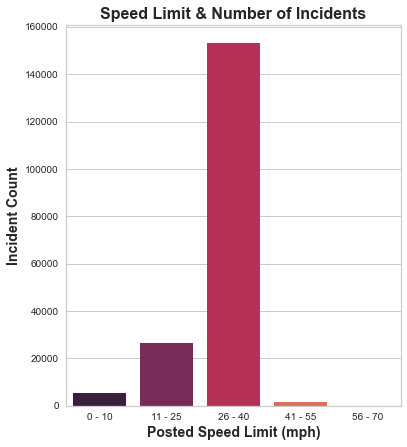

In [24]:
# plotting SPEED_LIMIT by number of incidents
plt.figure(figsize=(6,7))
sns.countplot(x=df['SPEED_LIMIT'], 
              data=df, 
              palette='rocket')
plt.xlabel('Posted Speed Limit (mph)', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.title('Speed Limit & Number of Incidents', weight='bold', size=16);

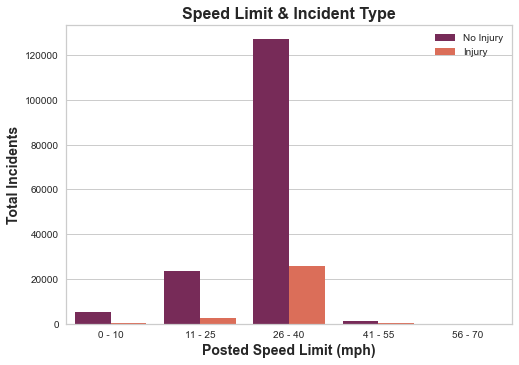

In [25]:
# plotting SPEED_LIMIT by incident type occurrence
sns.countplot(x='SPEED_LIMIT', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Posted Speed Limit (mph)', weight='bold', size=14)
plt.title('Speed Limit & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury']);

<Figure size 288x360 with 0 Axes>

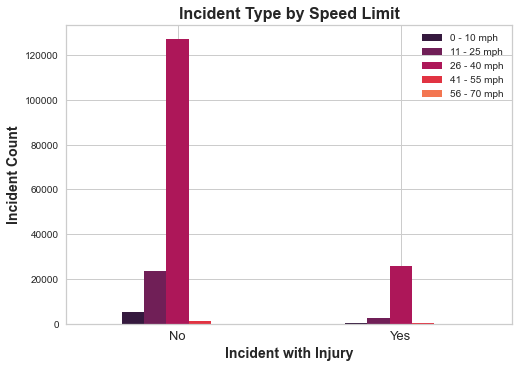

In [26]:
# plotting Incident Type grouped by SPEED_LIMIT
plt.figure(figsize=(4,5))
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','SPEED_LIMIT']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels = ['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Speed Limit', weight='bold', size=16)
plt.legend(['0 - 10 mph','11 - 25 mph','26 - 40 mph','41 - 55 mph','56 - 70 mph']);

In [27]:
# confirming new value types, percentages, and remaining nulls
df['SPEED_LIMIT'].value_counts(dropna=False, normalize=True)

26 - 40    0.820054
11 - 25    0.141436
0 - 10     0.029503
41 - 55    0.008916
56 - 70    0.000091
Name: SPEED_LIMIT, dtype: float64

In [28]:
# confirming dtype for one hot encoding in later pipeline 
df['SPEED_LIMIT'] = df['SPEED_LIMIT'].astype(object)
df['SPEED_LIMIT'].dtype

dtype('O')

#### TRAFFIC_CONTROL_DEVICE
 - "Traffic control device present at crash location, as determined by reporting officer"

In [29]:
# checking column values and remaining nulls
df['TRAFFIC_CONTROL_DEVICE'].value_counts(dropna=False)

NO CONTROLS                 103579
TRAFFIC SIGNAL               54044
STOP SIGN/FLASHER            19591
UNKNOWN                       6760
OTHER                         1299
YIELD                          243
OTHER REG. SIGN                210
PEDESTRIAN CROSSING SIGN       149
OTHER WARNING SIGN             143
RAILROAD CROSSING GATE         138
DELINEATORS                    132
FLASHING CONTROL SIGNAL         91
SCHOOL ZONE                     87
OTHER RAILROAD CROSSING         49
POLICE/FLAGMAN                  48
RR CROSSING SIGN                46
NO PASSING                      16
BICYCLE CROSSING SIGN            3
Name: TRAFFIC_CONTROL_DEVICE, dtype: int64

In [30]:
# defining dictionary map and mapping dictionary on column
traffic_device_map = {'NO CONTROLS': 'NO TRAFFIC SIGNAL/SIGN',
                      'TRAFFIC SIGNAL': 'TRAFFIC SIGNAL/SIGN',
                      'STOP SIGN/FLASHER': 'STOP SIGN',
                      'UNKNOWN': 'UNKNOWN/OTHER',
                      'OTHER': 'UNKNOWN/OTHER',
                      'YIELD': 'YIELD SIGN',
                      'OTHER REG. SIGN': 'TRAFFIC SIGNAL/SIGN',
                      'PEDESTRIAN CROSSING SIGN': 'SCHOOL/PEDESTRIAN/BICYCLE SIGN',
                      'OTHER WARNING SIGN': 'HAZARD MARKERS',  
                      'RAILROAD CROSSING GATE': 'RAILROAD SIGN',
                      'DELINEATORS': 'HAZARD MARKERS',
                      'FLASHING CONTROL SIGNAL': 'TRAFFIC SIGNAL/SIGN',
                      'SCHOOL ZONE' : 'SCHOOL/PEDESTRIAN/BICYCLE SIGN',
                      'POLICE/FLAGMAN': 'HAZARD MARKERS',
                      'OTHER RAILROAD CROSSING': 'RAILROAD SIGN',
                      'RR CROSSING SIGN': 'RAILROAD SIGN',
                      'NO PASSING': 'HAZARD MARKERS',  
                      'BICYCLE CROSSING SIGN': 'SCHOOL/PEDESTRIAN/BICYCLE SIGN'}

df['TRAFFIC_CONTROL_DEVICE'] = df['TRAFFIC_CONTROL_DEVICE'].map(traffic_device_map)
df['TRAFFIC_CONTROL_DEVICE'].value_counts(dropna=False)

NO TRAFFIC SIGNAL/SIGN            103579
TRAFFIC SIGNAL/SIGN                54345
STOP SIGN                          19591
UNKNOWN/OTHER                       8059
HAZARD MARKERS                       339
YIELD SIGN                           243
SCHOOL/PEDESTRIAN/BICYCLE SIGN       239
RAILROAD SIGN                        233
Name: TRAFFIC_CONTROL_DEVICE, dtype: int64

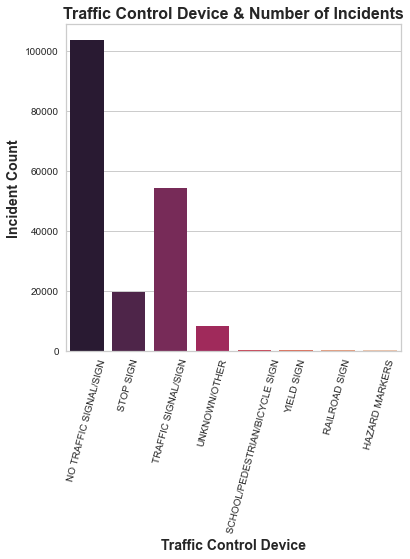

In [31]:
# plotting TRAFFIC_CONTROL_DEVICE by number of incidents
plt.figure(figsize=(6,6))
sns.countplot(x=df['TRAFFIC_CONTROL_DEVICE'], 
              data=df, 
              palette='rocket')
plt.xlabel('Traffic Control Device', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=75)
plt.title('Traffic Control Device & Number of Incidents', weight='bold', size=16);

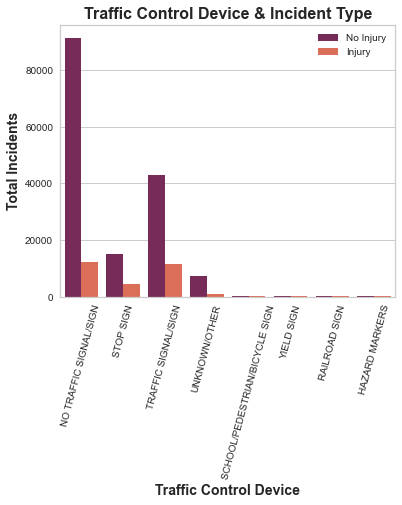

In [32]:
# plotting TRAFFIC_CONTROL_DEVICE by incident type occurrence
plt.figure(figsize=(6,5))
sns.countplot(x='TRAFFIC_CONTROL_DEVICE', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Traffic Control Device', weight='bold', size=14)
plt.title('Traffic Control Device & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.xticks(rotation=75);

<Figure size 360x288 with 0 Axes>

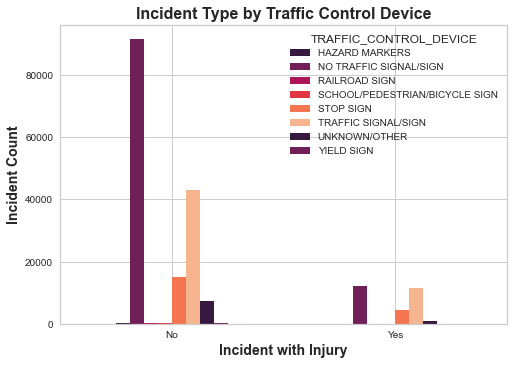

In [33]:
# plotting Incident Type grouped by TRAFFIC_CONTROL_DEVICE
plt.figure(figsize=(5,4))
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','TRAFFIC_CONTROL_DEVICE']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels = ['No','Yes'], rotation=360)
plt.title('Incident Type by Traffic Control Device', weight='bold', size=16);

In [34]:
# confirming new value types, percentages, and remaining nulls
df['TRAFFIC_CONTROL_DEVICE'].value_counts(dropna=False, normalize=True)

NO TRAFFIC SIGNAL/SIGN            0.555002
TRAFFIC SIGNAL/SIGN               0.291194
STOP SIGN                         0.104974
UNKNOWN/OTHER                     0.043182
HAZARD MARKERS                    0.001816
YIELD SIGN                        0.001302
SCHOOL/PEDESTRIAN/BICYCLE SIGN    0.001281
RAILROAD SIGN                     0.001248
Name: TRAFFIC_CONTROL_DEVICE, dtype: float64

In [35]:
# confirming dtype for one hot encoding in later pipeline 
df['TRAFFIC_CONTROL_DEVICE'].dtype

dtype('O')

#### DEVICE_CONDITION
 - "Condition of traffic control device, as determined by reporting officer"

In [36]:
# checking column values and remaining nulls
df['DEVICE_CONDITION'].value_counts(dropna=False)

NO CONTROLS                 105210
FUNCTIONING PROPERLY         66752
UNKNOWN                      11871
OTHER                         1403
FUNCTIONING IMPROPERLY         773
NOT FUNCTIONING                550
WORN REFLECTIVE MATERIAL        45
MISSING                         24
Name: DEVICE_CONDITION, dtype: int64

In [37]:
# defining dictionary map and mapping dictionary on column
device_condition_map = {'NO CONTROLS': 'NO CONTROLS',
                        'FUNCTIONING PROPERLY': 'FUNCTIONING PROPERLY',
                        'UNKNOWN': 'OTHER/UNKNOWN',
                        'OTHER': 'OTHER/UNKNOWN',
                        'FUNCTIONING IMPROPERLY': 'FUNCTIONING IMPROPERLY',
                        'NOT FUNCTIONING': 'FUNCTIONING IMPROPERLY',
                        'WORN REFLECTIVE MATERIAL': 'FUNCTIONING IMPROPERLY',
                        'MISSING': 'FUNCTIONING IMPROPERLY'}

df['DEVICE_CONDITION'] = df['DEVICE_CONDITION'].map(device_condition_map)
df['DEVICE_CONDITION'].value_counts(dropna=False)

NO CONTROLS               105210
FUNCTIONING PROPERLY       66752
OTHER/UNKNOWN              13274
FUNCTIONING IMPROPERLY      1392
Name: DEVICE_CONDITION, dtype: int64

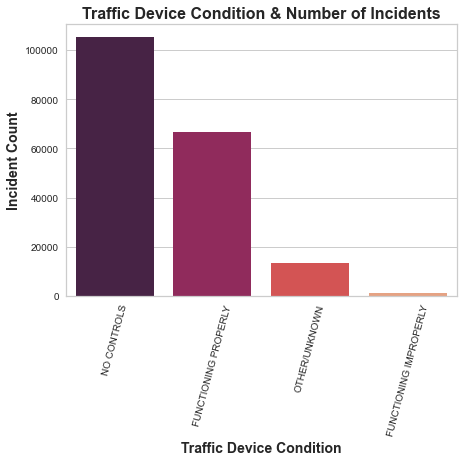

In [38]:
# plotting Traffic Device Condition by number of incidents
plt.figure(figsize=(7,5))
sns.countplot(x=df['DEVICE_CONDITION'], 
              data=df, 
              palette='rocket')
plt.xlabel('Traffic Device Condition', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=75)
plt.title('Traffic Device Condition & Number of Incidents', weight='bold', size=16);

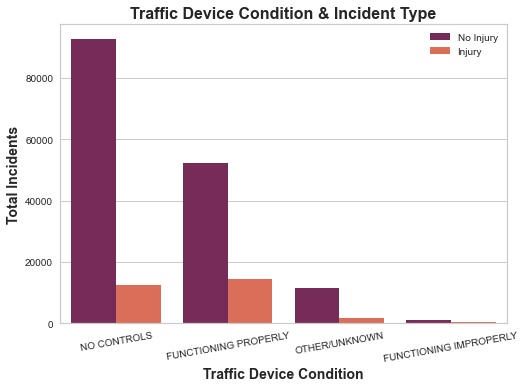

In [39]:
# plotting DEVICE_CONDITION by incident type occurrence
sns.countplot(x='DEVICE_CONDITION', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Traffic Device Condition', weight='bold', size=14)
plt.title('Traffic Device Condition & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.xticks(rotation=10);

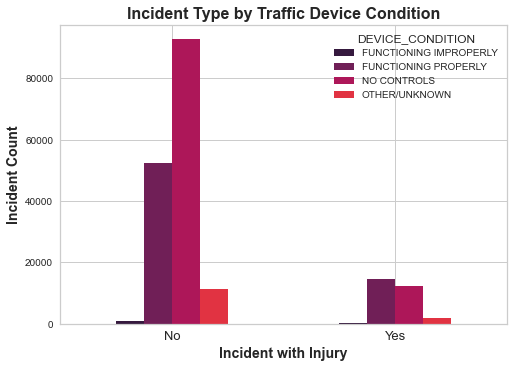

In [40]:
# plotting Incident Type grouped by DEVICE_CONDITION
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','DEVICE_CONDITION']).size().unstack(level=1)
df_gb.plot(kind = 'bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels = ['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Traffic Device Condition', weight='bold', size=16);

In [41]:
# confirming new value types, percentages, and remaining nulls
df['DEVICE_CONDITION'].value_counts(dropna=False, normalize=True)

NO CONTROLS               0.563742
FUNCTIONING PROPERLY      0.357674
OTHER/UNKNOWN             0.071125
FUNCTIONING IMPROPERLY    0.007459
Name: DEVICE_CONDITION, dtype: float64

In [42]:
# confirming dtype for one hot encoding in later pipeline 
df['DEVICE_CONDITION'].dtype

dtype('O')

#### WEATHER_CONDITION
 - "Traffic control device present at crash location, as determined by reporting officer"

In [43]:
# checking column values and remaining nulls
df['WEATHER_CONDITION'].value_counts(dropna=False)

CLEAR                       147747
RAIN                         16573
UNKNOWN                       9605
CLOUDY/OVERCAST               5568
SNOW                          5363
FREEZING RAIN/DRIZZLE          665
OTHER                          579
SLEET/HAIL                     181
BLOWING SNOW                   179
FOG/SMOKE/HAZE                 125
SEVERE CROSS WIND GATE          39
BLOWING SAND, SOIL, DIRT         4
Name: WEATHER_CONDITION, dtype: int64

In [44]:
# defining dictionary map and mapping dictionary on column
weather_map = {'CLEAR': 'CLEAR',
               'RAIN': 'RAIN/SNOW',
               'UNKNOWN': 'OTHER/UNKNOWN',
               'CLOUDY/OVERCAST': 'CLOUDY/FOG/HAZE',
               'SNOW': 'RAIN/SNOW',
               'FREEZING RAIN/DRIZZLE': 'RAIN/SNOW',
               'OTHER': 'OTHER/UNKNOWN',
               'SLEET/HAIL': 'RAIN/SNOW',
               'BLOWING SNOW': 'RAIN/SNOW',
               'FOG/SMOKE/HAZE': 'CLOUDY/FOG/HAZE',
               'SEVERE CROSS WIND GATE': 'WINDY',
               'BLOWING SAND, SOIL, DIRT': 'WINDY'}

df['WEATHER_CONDITION'] = df['WEATHER_CONDITION'].map(weather_map)
df['WEATHER_CONDITION'].value_counts(dropna=False)

CLEAR              147747
RAIN/SNOW           22961
OTHER/UNKNOWN       10184
CLOUDY/FOG/HAZE      5693
WINDY                  43
Name: WEATHER_CONDITION, dtype: int64

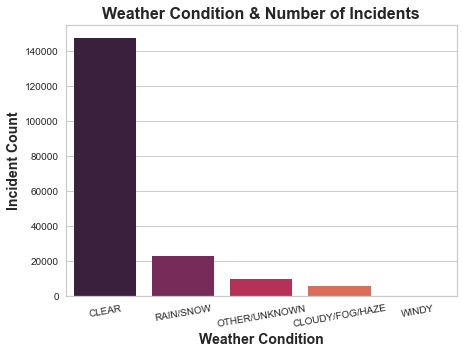

In [45]:
# plotting WEATHER_CONDITION by number of incidents
plt.figure(figsize=(7,5))
sns.countplot(x=df['WEATHER_CONDITION'], 
              data=df, 
              palette='rocket')
plt.xlabel('Weather Condition', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=10)
plt.title('Weather Condition & Number of Incidents', weight='bold', size=16);

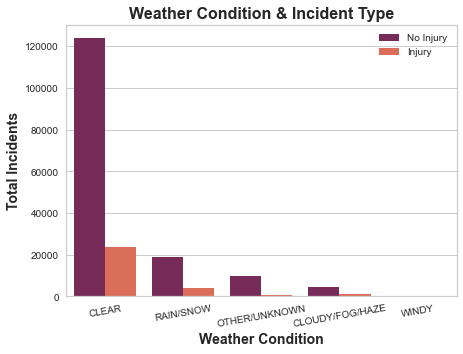

In [46]:
# plotting WEATHER_CONDITION by incident type occurrence
plt.figure(figsize=(7,5))
sns.countplot(x='WEATHER_CONDITION', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Weather Condition', weight='bold', size=14)
plt.title('Weather Condition & Incident Type', weight='bold', size=16)
plt.xticks(rotation=10)
plt.legend(['No Injury','Injury']);

<Figure size 504x360 with 0 Axes>

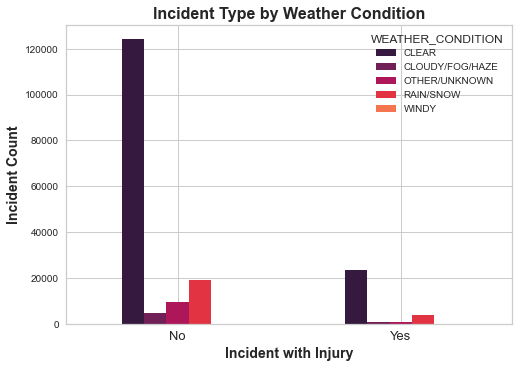

In [47]:
# plotting Incident Type grouped by WEATHER_CONDITION
plt.figure(figsize=(7,5))
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury', 'WEATHER_CONDITION']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels = ['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Weather Condition', weight='bold', size=16);

In [48]:
# confirming new value types, percentages, and remaining nulls
df['WEATHER_CONDITION'].value_counts(dropna=False, normalize=True)

CLEAR              0.791666
RAIN/SNOW          0.123031
OTHER/UNKNOWN      0.054568
CLOUDY/FOG/HAZE    0.030505
WINDY              0.000230
Name: WEATHER_CONDITION, dtype: float64

In [49]:
# confirming dtype for one hot encoding in later pipeline 
df['WEATHER_CONDITION'].dtype

dtype('O')

#### LIGHTING_CONDITION
 - "Light condition at time of crash, as determined by reporting officer"

In [50]:
# checking column values and remaining nulls
df['LIGHTING_CONDITION'].value_counts(dropna=False)

DAYLIGHT                  120062
DARKNESS, LIGHTED ROAD     44371
UNKNOWN                     7357
DARKNESS                    7042
DUSK                        4899
DAWN                        2897
Name: LIGHTING_CONDITION, dtype: int64

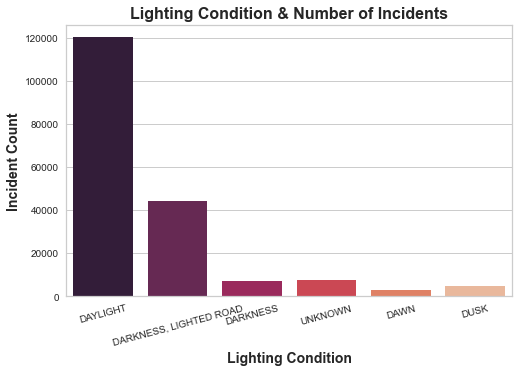

In [51]:
# plotting LIGHTING_CONDITION by number of incidents
plt.figure(figsize=(8,5))
sns.countplot(x=df['LIGHTING_CONDITION'], 
              data=df, 
              palette='rocket')
plt.xlabel('Lighting Condition', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=15)
plt.title('Lighting Condition & Number of Incidents', weight='bold', size=16);

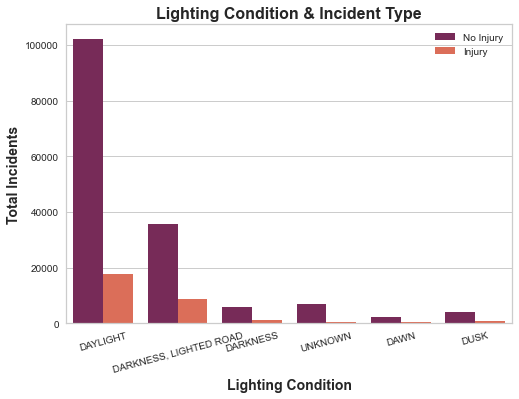

In [52]:
# plotting LIGHTING_CONDITION by incident type occurrence
sns.countplot(x='LIGHTING_CONDITION', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Lighting Condition', weight='bold', size=14)
plt.xticks(rotation=15)
plt.title('Lighting Condition & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury']);

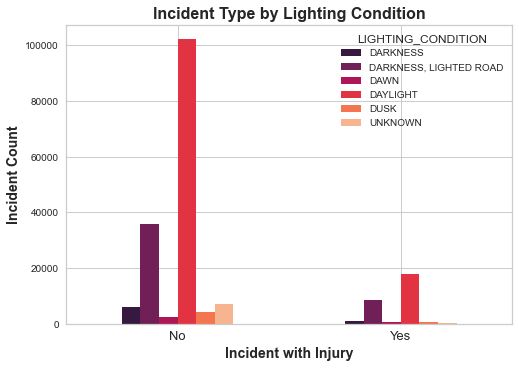

In [53]:
# plotting Incident Type grouped by LIGHTING_CONDITION
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','LIGHTING_CONDITION']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Lighting Condition', weight='bold', size=16);

In [54]:
# confirming value types, percentages, and remaining nulls
df['LIGHTING_CONDITION'].value_counts(dropna=False, normalize=True)

DAYLIGHT                  0.643323
DARKNESS, LIGHTED ROAD    0.237751
UNKNOWN                   0.039421
DARKNESS                  0.037733
DUSK                      0.026250
DAWN                      0.015523
Name: LIGHTING_CONDITION, dtype: float64

In [55]:
# confirming dtype for one hot encoding in later pipeline 
df['LIGHTING_CONDITION'].dtype

dtype('O')

#### FIRST_CRASH_TYPE
 - "Type of first collision in crash"

In [56]:
# checking column values and remaining nulls
df['FIRST_CRASH_TYPE'].value_counts(dropna=False)

PARKED MOTOR VEHICLE            42679
REAR END                        41701
TURNING                         29655
SIDESWIPE SAME DIRECTION        28313
ANGLE                           23363
FIXED OBJECT                     5697
REAR TO FRONT                    2955
SIDESWIPE OPPOSITE DIRECTION     2499
PEDESTRIAN                       2382
HEAD ON                          1755
REAR TO SIDE                     1723
PEDALCYCLIST                     1631
OTHER OBJECT                     1184
REAR TO REAR                      595
OTHER NONCOLLISION                349
OVERTURNED                         79
ANIMAL                             63
TRAIN                               5
Name: FIRST_CRASH_TYPE, dtype: int64

In [57]:
# defining dictionary map and mapping dictionary on column
crash_map = {'PARKED MOTOR VEHICLE': 'PARKED/FIXED',
             'REAR END': 'FRONT TO FRONT/REAR',
             'TURNING': 'TURNING/ANGLE',
             'SIDESWIPE SAME DIRECTION': 'SIDESWIPE',
             'ANGLE': 'TURNING/ANGLE',
             'FIXED OBJECT': 'PARKED/FIXED',
             'REAR TO FRONT': 'REAR TO FRONT/REAR/SIDE',
             'SIDESWIPE OPPOSITE DIRECTION': 'SIDESWIPE',
             'PEDESTRIAN': 'PED/CYCLIST',
             'PEDALCYCLIST': 'PED/CYCLIST',
             'REAR TO SIDE': 'REAR TO FRONT/REAR/SIDE',
             'HEAD ON': 'FRONT TO FRONT/REAR',
             'OTHER OBJECT': 'OTHER',
             'REAR TO REAR': 'REAR TO FRONT/REAR/SIDE',
             'OTHER NONCOLLISION': 'OTHER',
             'OVERTURNED': 'OVERTURNED',
             'ANIMAL': 'ANIMAL',
             'TRAIN': 'TRAIN'}

df['FIRST_CRASH_TYPE'] = df['FIRST_CRASH_TYPE'].map(crash_map)
df['FIRST_CRASH_TYPE'].value_counts(dropna=False)

TURNING/ANGLE              53018
PARKED/FIXED               48376
FRONT TO FRONT/REAR        43456
SIDESWIPE                  30812
REAR TO FRONT/REAR/SIDE     5273
PED/CYCLIST                 4013
OTHER                       1533
OVERTURNED                    79
ANIMAL                        63
TRAIN                          5
Name: FIRST_CRASH_TYPE, dtype: int64

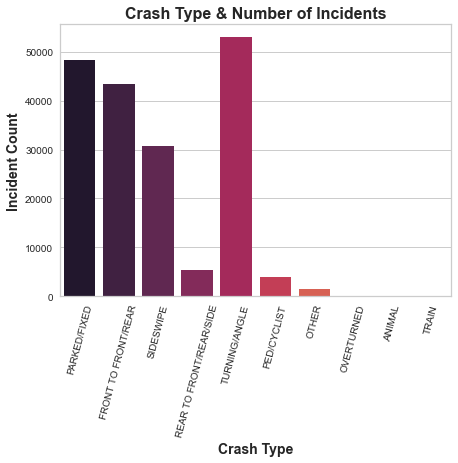

In [58]:
# plotting FIRST_CRASH_TYPE by number of incidents
plt.figure(figsize=(7,5))
sns.countplot(x=df['FIRST_CRASH_TYPE'], 
              data=df, 
              palette='rocket')
plt.xlabel('Crash Type', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=75)
plt.title('Crash Type & Number of Incidents', weight='bold', size=16)
plt.savefig('Crash Type & Number of Incidents.jpg', dpi = 400);

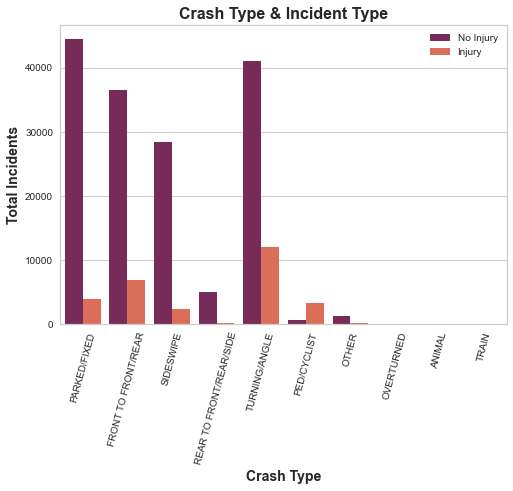

In [59]:
# plotting FIRST_CRASH_TYPE by incident type occurrence
sns.countplot(x='FIRST_CRASH_TYPE', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Crash Type', weight='bold', size=14)
plt.xticks(rotation=75)
plt.title('Crash Type & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.savefig('Crash Type & Incident Type.jpg', dpi = 400);

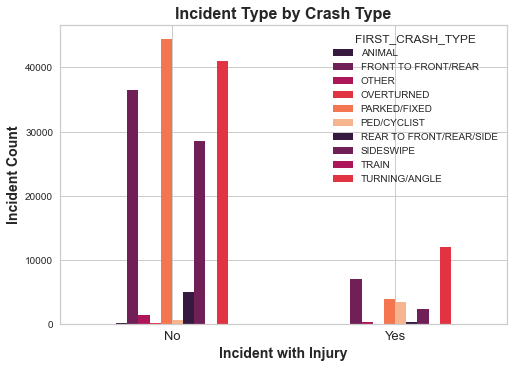

In [60]:
# plotting Incident Type grouped by FIRST_CRASH_TYPE
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','FIRST_CRASH_TYPE']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Crash Type', weight='bold', size=16);

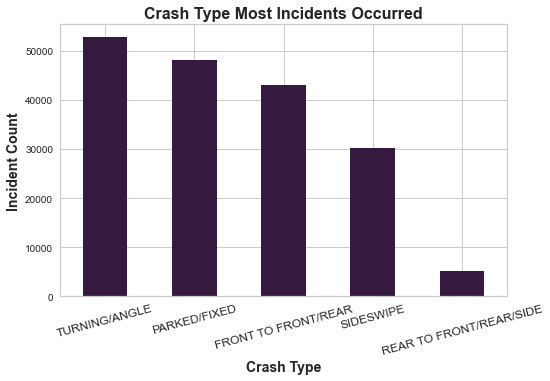

In [191]:
# bar plot of top 5 crash type values with most incidents 
sns.set_palette('rocket')
df['FIRST_CRASH_TYPE'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Crash Type', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=375, fontsize=12)
plt.title('Crash Type Most Incidents Occurred', weight='bold', size=16)
plt.savefig('Crash Type Most Incidents Occurred.jpg', dpi=400);

In [62]:
# confirming new value types, percentages, and remaining nulls
df['FIRST_CRASH_TYPE'].value_counts(dropna=False, normalize=True)

TURNING/ANGLE              0.284084
PARKED/FIXED               0.259211
FRONT TO FRONT/REAR        0.232848
SIDESWIPE                  0.165098
REAR TO FRONT/REAR/SIDE    0.028254
PED/CYCLIST                0.021503
OTHER                      0.008214
OVERTURNED                 0.000423
ANIMAL                     0.000338
TRAIN                      0.000027
Name: FIRST_CRASH_TYPE, dtype: float64

In [63]:
# confirming dtype for one hot encoding in later pipeline 
df['FIRST_CRASH_TYPE'].dtype

dtype('O')

#### TRAFFICWAY_TYPE
 - "Trafficway type, as determined by reporting officer"

In [64]:
# checking column values and remaining nulls
df['TRAFFICWAY_TYPE'].value_counts(dropna=False)

NOT DIVIDED                        80815
DIVIDED - W/MEDIAN (NOT RAISED)    26823
ONE-WAY                            21838
FOUR WAY                           18981
PARKING LOT                        10965
DIVIDED - W/MEDIAN BARRIER         10517
OTHER                               4294
T-INTERSECTION                      3750
ALLEY                               2514
UNKNOWN                             1817
CENTER TURN LANE                     967
UNKNOWN INTERSECTION TYPE            799
RAMP                                 529
DRIVEWAY                             457
Y-INTERSECTION                       411
TRAFFIC ROUTE                        386
FIVE POINT, OR MORE                  381
NOT REPORTED                         260
ROUNDABOUT                            68
L-INTERSECTION                        56
Name: TRAFFICWAY_TYPE, dtype: int64

In [65]:
# defining dictionary map and mapping dictionary on column
trafficway_map = {'NOT DIVIDED': 'NOT DIVIDED',
                  'DIVIDED - W/MEDIAN (NOT RAISED)': 'DIVIDED',
                  'ONE-WAY': 'ONE-WAY',
                  'FOUR WAY': 'FOUR WAY',
                  'PARKING LOT': 'PARKING LOT',
                  'DIVIDED - W/MEDIAN BARRIER': 'DIVIDED',
                  'OTHER': 'OTHER/UNKNOWN',
                  'T-INTERSECTION': 'T-INTERSECTION',
                  'ALLEY': 'ALLEY',
                  'UNKNOWN': 'OTHER/UNKNOWN',
                  'CENTER TURN LANE': 'OTHER INTERSECTION',
                  'UNKNOWN INTERSECTION TYPE': 'OTHER INTERSECTION',
                  'RAMP': 'OTHER/UNKNOWN',
                  'DRIVEWAY': 'OTHER/UNKNOWN',
                  'FIVE POINT, OR MORE': 'FIVE POINT, OR MORE/ROUNDABOUT',
                  'Y-INTERSECTION': 'OTHER INTERSECTION',
                  'TRAFFIC ROUTE': 'OTHER/UNKNOWN',
                  'NOT REPORTED': 'OTHER/UNKNOWN',
                  'ROUNDABOUT': 'FIVE POINT, OR MORE/ROUNDABOUT',
                  'L-INTERSECTION': 'OTHER INTERSECTION'}

df['TRAFFICWAY_TYPE'] = df['TRAFFICWAY_TYPE'].map(trafficway_map)
df['TRAFFICWAY_TYPE'].value_counts(dropna=False)

NOT DIVIDED                       80815
DIVIDED                           37340
ONE-WAY                           21838
FOUR WAY                          18981
PARKING LOT                       10965
OTHER/UNKNOWN                      7743
T-INTERSECTION                     3750
ALLEY                              2514
OTHER INTERSECTION                 2233
FIVE POINT, OR MORE/ROUNDABOUT      449
Name: TRAFFICWAY_TYPE, dtype: int64

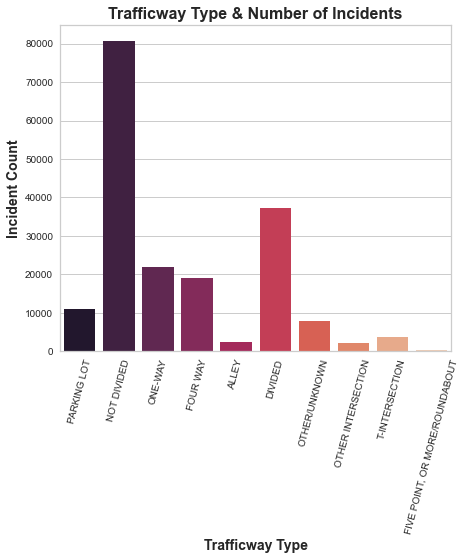

In [66]:
# plotting TRAFFICWAY_TYPE by number of incidents
plt.figure(figsize=(7,6))
sns.countplot(x=df['TRAFFICWAY_TYPE'], 
              data=df, 
              palette='rocket')
plt.xlabel('Trafficway Type', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=75)
plt.title('Trafficway Type & Number of Incidents', weight='bold', size=16)
plt.savefig('Trafficway Type & Number of Incidents.jpg', dpi = 400);

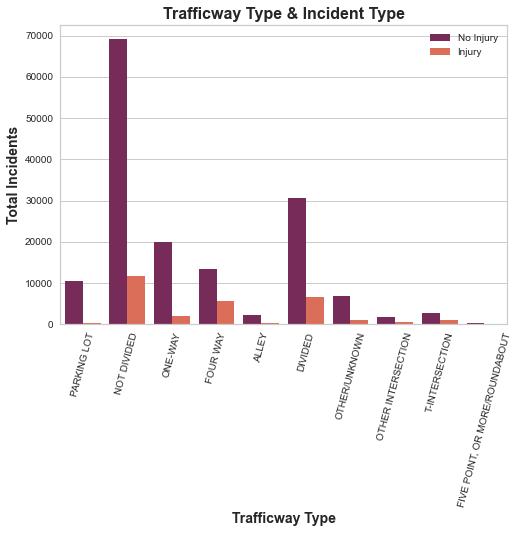

In [67]:
# plotting TRAFFICWAY_TYPE by incident type occurrence
sns.countplot(x='TRAFFICWAY_TYPE', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Trafficway Type', weight='bold', size=14)
plt.xticks(rotation=75)
plt.title('Trafficway Type & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.savefig('Trafficway Type & Incident Type.jpg', dpi = 400);

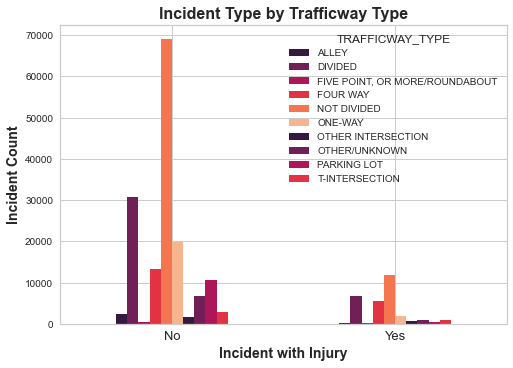

In [68]:
# plotting Incident Type grouped by TRAFFICWAY_TYPE
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','TRAFFICWAY_TYPE']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Trafficway Type', weight='bold', size=16);

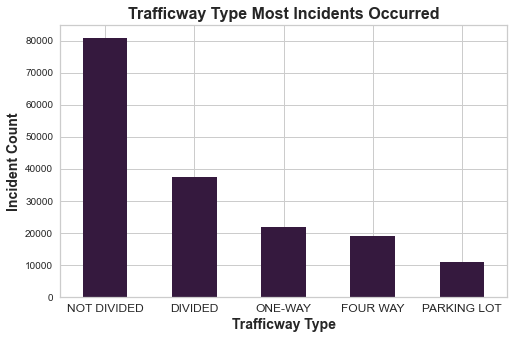

In [69]:
# bar plot of top 5 trafficway type values with most incidents 
sns.set_palette('rocket')
df['TRAFFICWAY_TYPE'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Trafficway Type', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=360, fontsize=12)
plt.title('Trafficway Type Most Incidents Occurred', weight='bold', size=16)
plt.savefig('Trafficway Type Most Incidents Occurred.jpg', dpi=400);

In [70]:
# confirming new value types, percentages, and remaining nulls
df['TRAFFICWAY_TYPE'].value_counts(dropna=False, normalize=True)

NOT DIVIDED                       0.433027
DIVIDED                           0.200077
ONE-WAY                           0.117014
FOUR WAY                          0.101705
PARKING LOT                       0.058753
OTHER/UNKNOWN                     0.041489
T-INTERSECTION                    0.020093
ALLEY                             0.013471
OTHER INTERSECTION                0.011965
FIVE POINT, OR MORE/ROUNDABOUT    0.002406
Name: TRAFFICWAY_TYPE, dtype: float64

In [71]:
# confirming dtype for one hot encoding in later pipeline 
df['TRAFFICWAY_TYPE'].dtype

dtype('O')

#### ALIGNMENT
 - "Street alignment at crash location, as determined by reporting office"

In [72]:
# checking column values and remaining nulls
df['ALIGNMENT'].value_counts(dropna=False)

STRAIGHT AND LEVEL       182132
STRAIGHT ON GRADE          2620
CURVE, LEVEL               1150
STRAIGHT ON HILLCREST       411
CURVE ON GRADE              245
CURVE ON HILLCREST           70
Name: ALIGNMENT, dtype: int64

In [73]:
# creating new column with redefined 'alignment' values to create a binary outcome: 1 if road was straight, 0 if curved
df['STRAIGHT_ALIGNMENT'] = df['ALIGNMENT'].map(lambda x: 1 if 'STRAIGHT' in x else 0)
df = df.drop(['ALIGNMENT'], axis=1)
print(df.shape)
df['STRAIGHT_ALIGNMENT'].value_counts(dropna=False)

(186628, 31)


1    185163
0      1465
Name: STRAIGHT_ALIGNMENT, dtype: int64

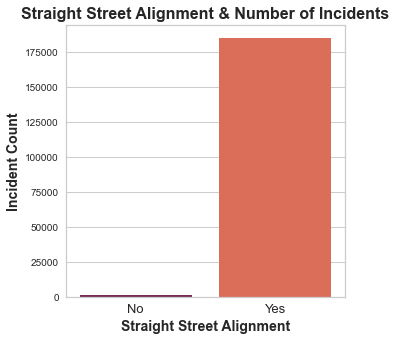

In [74]:
# plotting STRAIGHT_ALIGNMENT by number of incidents
plt.figure(figsize=(5,5))
sns.countplot(x=df['STRAIGHT_ALIGNMENT'], 
              data=df, 
              palette='rocket').set_xticklabels(['No','Yes'], fontsize=13)
plt.xlabel('Straight Street Alignment', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.title('Straight Street Alignment & Number of Incidents', weight='bold', size=16);

In [75]:
# confirming new value types, percentages, and remaining nulls
df['STRAIGHT_ALIGNMENT'].value_counts(dropna=False, normalize=True)

1    0.99215
0    0.00785
Name: STRAIGHT_ALIGNMENT, dtype: float64

In [76]:
# nearly 99% of the streets where an incident occured are reported to be straight. dropping column for large imbalance.
df = df.drop(['STRAIGHT_ALIGNMENT'], axis=1)
df.shape

(186628, 30)

#### ROADWAY_SURFACE_COND
 - "Road surface condition, as determined by reporting officer"

In [77]:
# checking column values and remaining nulls
df['ROADWAY_SURFACE_COND'].value_counts(dropna=False)

DRY                137869
WET                 24532
UNKNOWN             16071
SNOW OR SLUSH        6290
ICE                  1308
OTHER                 520
SAND, MUD, DIRT        38
Name: ROADWAY_SURFACE_COND, dtype: int64

In [78]:
# defining dictionary map and mapping dictionary on column
road_surface_map = {'DRY': 'DRY',
                    'WET': 'WET',
                    'UNKNOWN': 'OTHER/UNKNOWN',
                    'SNOW OR SLUSH': 'SNOW/ICE',
                    'ICE': 'SNOW/ICE',
                    'OTHER': 'OTHER/UNKNOWN',
                    'SAND, MUD, DIRT': 'OTHER/UNKNOWN'}

df['ROADWAY_SURFACE_COND'] = df['ROADWAY_SURFACE_COND'].map(road_surface_map)
df['ROADWAY_SURFACE_COND'].value_counts(dropna=False)

DRY              137869
WET               24532
OTHER/UNKNOWN     16629
SNOW/ICE           7598
Name: ROADWAY_SURFACE_COND, dtype: int64

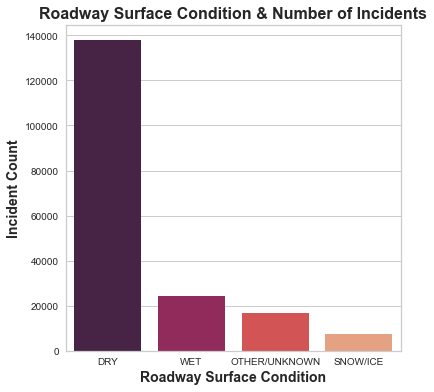

In [79]:
# plotting ROADWAY_SURFACE_COND by number of incidents
plt.figure(figsize=(6,6))
sns.countplot(x=df['ROADWAY_SURFACE_COND'], 
              data=df, 
              palette='rocket')
plt.xlabel('Roadway Surface Condition', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.title('Roadway Surface Condition & Number of Incidents', weight='bold', size=16);

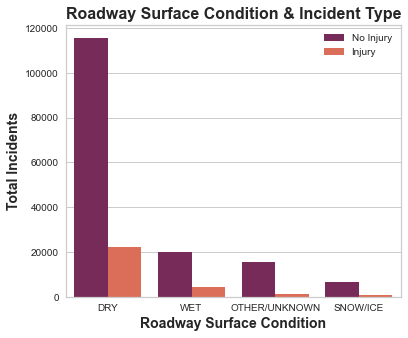

In [80]:
# plotting ROADWAY_SURFACE_COND by incident type occurrence
plt.figure(figsize=(6,5))
sns.countplot(x='ROADWAY_SURFACE_COND', 
              hue = 'Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Roadway Surface Condition', weight='bold', size=14)
plt.title('Roadway Surface Condition & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury']);

<Figure size 360x360 with 0 Axes>

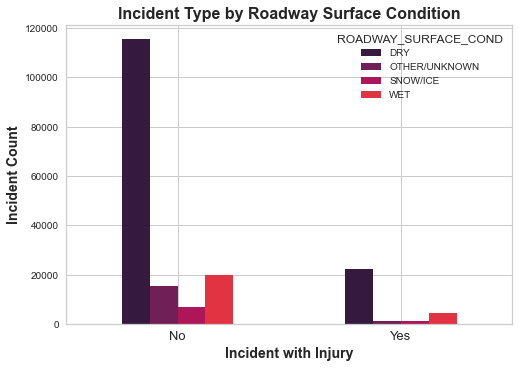

In [81]:
# plotting Incident Type grouped by ROADWAY_SURFACE_COND
plt.figure(figsize=(5,5))
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','ROADWAY_SURFACE_COND']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Roadway Surface Condition', weight='bold', size=16);

In [82]:
# confirming new value types, percentages, and remaining nulls
df['ROADWAY_SURFACE_COND'].value_counts(dropna=False, normalize=True)

DRY              0.738737
WET              0.131449
OTHER/UNKNOWN    0.089102
SNOW/ICE         0.040712
Name: ROADWAY_SURFACE_COND, dtype: float64

In [83]:
# confirming dtype for one hot encoding in later pipeline 
df['ROADWAY_SURFACE_COND'].dtype

dtype('O')

#### ROAD_DEFECT
 - "Road defects, as determined by reporting officer"

In [84]:
# checking column values and remaining nulls
df['ROAD_DEFECT'].value_counts(dropna=False)

NO DEFECTS           148455
UNKNOWN               35222
OTHER                   886
RUT, HOLES              870
WORN SURFACE            815
SHOULDER DEFECT         277
DEBRIS ON ROADWAY       103
Name: ROAD_DEFECT, dtype: int64

In [85]:
# defining dictionary map and mapping dictionary on column
defects_map = {'NO DEFECTS': 'NO DEFECTS',
              'UNKNOWN': 'UNKNOWN/OTHER',
              'OTHER': 'UNKNOWN/OTHER',
              'RUT, HOLES': 'RUT, HOLES',
              'WORN SURFACE': 'WORN SURFACE',
              'SHOULDER DEFECT': 'SHOULDER DEFECT',
              'DEBRIS ON ROADWAY': 'DEBRIS ON ROADWAY'}

df['ROAD_DEFECT'] = df['ROAD_DEFECT'].map(defects_map)
df['ROAD_DEFECT'].value_counts(dropna=False, normalize=True)

NO DEFECTS           0.795459
UNKNOWN/OTHER        0.193476
RUT, HOLES           0.004662
WORN SURFACE         0.004367
SHOULDER DEFECT      0.001484
DEBRIS ON ROADWAY    0.000552
Name: ROAD_DEFECT, dtype: float64

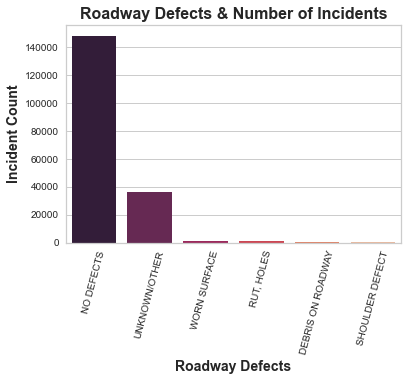

In [86]:
# plotting ROAD_DEFECT by number of incidents
plt.figure(figsize=(6,4))
sns.countplot(x=df['ROAD_DEFECT'], 
              data=df, 
              palette='rocket')
plt.xlabel('Roadway Defects', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=75)
plt.title('Roadway Defects & Number of Incidents', weight='bold', size=16);

In [87]:
# nearly 80% of the roads had no defect, the remaining 20% are nearly all other/unknown. dropping column for large imbalance.
df = df.drop(['ROAD_DEFECT'], axis=1)
df.shape

(186628, 29)

#### PRIM_CONTRIBUTORY_CAUSE
 - "The factor which was most significant in causing the crash, as determined by officer judgment"

In [88]:
df['PRIM_CONTRIBUTORY_CAUSE'].value_counts(dropna=False, normalize=True)

UNABLE TO DETERMINE                                                                 0.387846
FAILING TO YIELD RIGHT-OF-WAY                                                       0.114892
FOLLOWING TOO CLOSELY                                                               0.091605
IMPROPER OVERTAKING/PASSING                                                         0.050523
FAILING TO REDUCE SPEED TO AVOID CRASH                                              0.047806
NOT APPLICABLE                                                                      0.044398
IMPROPER BACKING                                                                    0.035397
DRIVING SKILLS/KNOWLEDGE/EXPERIENCE                                                 0.035289
IMPROPER TURNING/NO SIGNAL                                                          0.034850
IMPROPER LANE USAGE                                                                 0.034095
DISREGARDING TRAFFIC SIGNALS                                          

In [89]:
# dropping column since more than 40% is unable to determine/not applicable. 
# dropping related column: 'SEC_CONTRIBUTORY_CAUSE'. both columns are also subjective
df = df.drop(['PRIM_CONTRIBUTORY_CAUSE','SEC_CONTRIBUTORY_CAUSE'], axis=1)
df.shape

(186628, 27)

#### CRASH_HOUR
 - "The hour of the day component of CRASH_DATE"

In [90]:
# checking column values and remaining nulls
df['CRASH_HOUR'].value_counts(dropna=False)

15.0    15085
16.0    14484
17.0    13790
14.0    12500
18.0    11181
13.0    11127
12.0    10733
8.0      9606
11.0     9174
19.0     8335
10.0     8314
9.0      8202
7.0      7549
20.0     7113
21.0     5919
22.0     5782
23.0     5104
0.0      4368
1.0      3810
6.0      3541
2.0      3365
3.0      2776
5.0      2457
4.0      2313
Name: CRASH_HOUR, dtype: int64

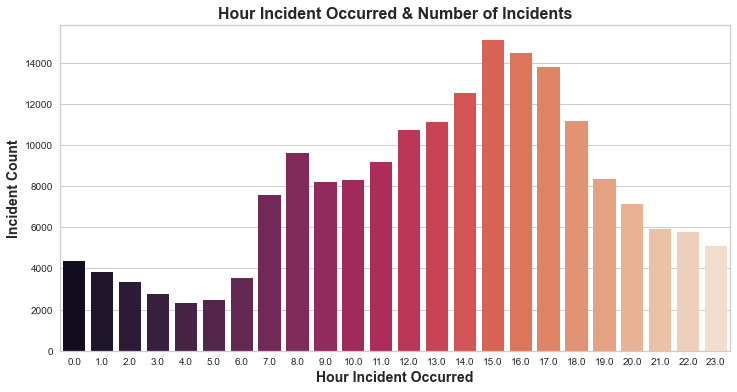

In [91]:
# plotting CRASH_HOUR by number of incidents
plt.figure(figsize=(12,6))
sns.countplot(x=df['CRASH_HOUR'], 
              data=df, 
              palette='rocket')
plt.xlabel('Hour Incident Occurred', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.title('Hour Incident Occurred & Number of Incidents', weight='bold', size=16)
plt.savefig('Hour Incident Occurred & Number of Incidents.jpg', dpi=400);

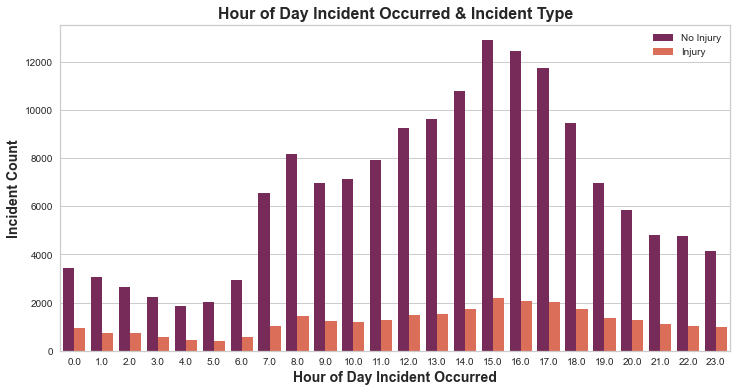

In [92]:
# plotting CRASH_HOUR by incident type occurrence
plt.figure(figsize=(12,6))
sns.countplot(x='CRASH_HOUR', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Incident Count', weight='bold', size=14)
plt.xlabel('Hour of Day Incident Occurred', weight='bold', size=14)
plt.title('Hour of Day Incident Occurred & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.savefig('Hour of Day Incident Occurred & Incident Type.jpg', dpi=400);

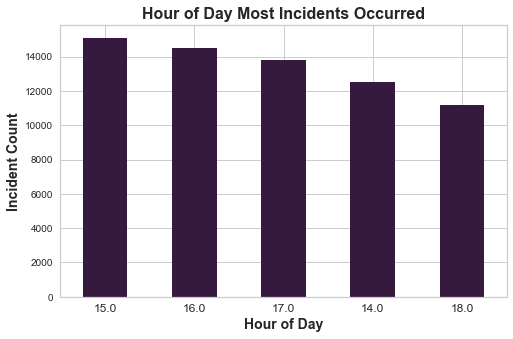

In [93]:
# bar plot of top 5 crash hour values with most incidents 
sns.set_palette('rocket')
df['CRASH_HOUR'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Hour of Day', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=360, fontsize=12)
plt.title('Hour of Day Most Incidents Occurred', weight='bold', size=16)
plt.savefig('Hour of Day Most Incidents Occurred.jpg', dpi=400);

In [94]:
# creating bins and label
df['CRASH_HOUR'] = pd.cut(x=df['CRASH_HOUR'],
                          bins=[-1,4,8,12,16,20,23],
                          labels=['12-4 AM','5-8 AM','9 AM-12 PM','1-4PM','5-8 PM','9-11:59 PM'])
print(df.shape)
df['CRASH_HOUR'].value_counts(dropna=False)

(186628, 27)


1-4PM         53196
5-8 PM        40419
9 AM-12 PM    36423
5-8 AM        23153
9-11:59 PM    16805
12-4 AM       16632
Name: CRASH_HOUR, dtype: int64

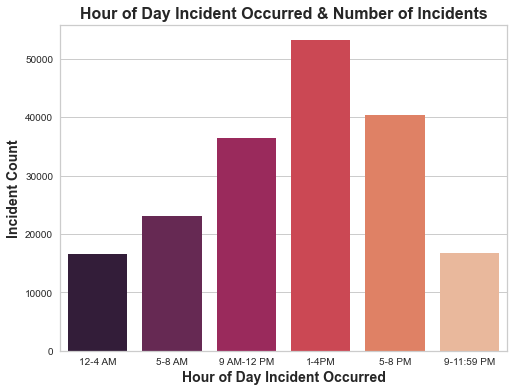

In [95]:
# plotting CRASH_HOUR by number of incidents
plt.figure(figsize=(8,6))
sns.countplot(x=df['CRASH_HOUR'], 
              data=df, 
              palette='rocket')
plt.xlabel('Hour of Day Incident Occurred', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.title('Hour of Day Incident Occurred & Number of Incidents', weight='bold', size=16)
plt.savefig('Hour of Day Incident Occurred & Number of Incidents bin.jpg', dpi=400);

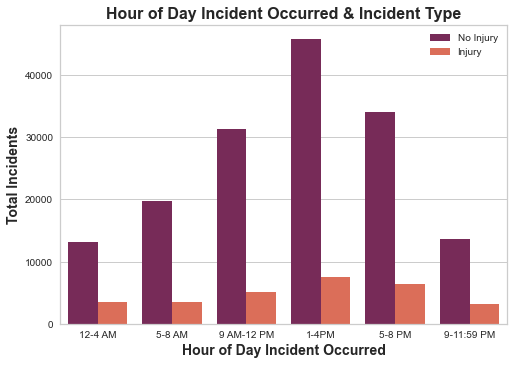

In [96]:
# plotting CRASH_HOUR by incident type occurrence
sns.countplot(x='CRASH_HOUR', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xlabel('Hour of Day Incident Occurred', weight='bold', size=14)
plt.title('Hour of Day Incident Occurred & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.savefig('Hour of Day Incident Occurred & Incident Type bin.jpg', dpi=400);

<Figure size 432x432 with 0 Axes>

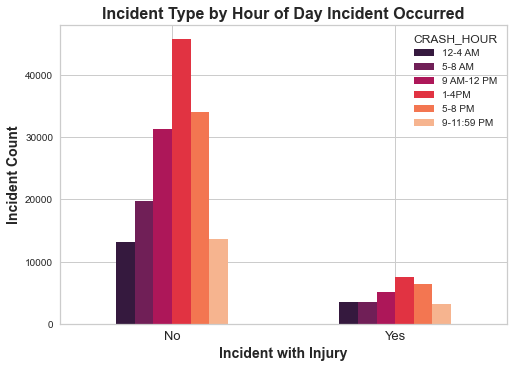

In [97]:
# plotting Incident Type grouped by CRASH_HOUR
plt.figure(figsize=(6,6))
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','CRASH_HOUR']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Hour of Day Incident Occurred', weight='bold', size=16);

In [98]:
# confirming new value types, percentages, and remaining nulls
df['CRASH_HOUR'].value_counts(dropna=False, normalize=True)

1-4PM         0.285038
5-8 PM        0.216575
9 AM-12 PM    0.195164
5-8 AM        0.124060
9-11:59 PM    0.090045
12-4 AM       0.089118
Name: CRASH_HOUR, dtype: float64

In [99]:
# confirming dtype for one hot encoding in later pipeline
df['CRASH_HOUR'] = df['CRASH_HOUR'].astype(object)
df['CRASH_HOUR'].dtype

dtype('O')

#### CRASH_DAY_OF_WEEK
 - "The day of the week component of CRASH_DATE. Sunday=1"

In [100]:
# checking column values and remaining nulls
df['CRASH_DAY_OF_WEEK'].value_counts(dropna=False)

6.0    30948
7.0    27733
5.0    27115
4.0    25974
3.0    25406
2.0    25200
1.0    24252
Name: CRASH_DAY_OF_WEEK, dtype: int64

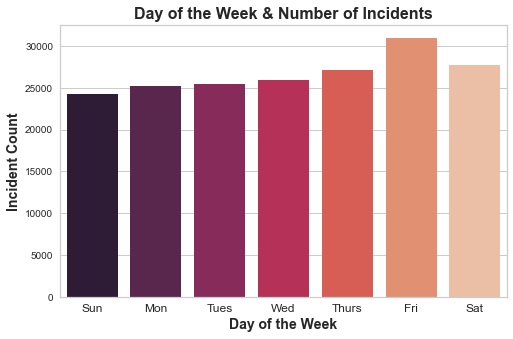

In [101]:
# plotting CRASH_DAY_OF_WEEK by number of incidents
plt.figure(figsize=(8,5))
sns.countplot(x=df['CRASH_DAY_OF_WEEK'], 
              data=df, 
              palette='rocket')
plt.xlabel('Day of the Week', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1,2,3,4,5,6], labels=['Sun','Mon','Tues','Wed','Thurs','Fri','Sat'], fontsize=12)
plt.title('Day of the Week & Number of Incidents', weight='bold', size=16);

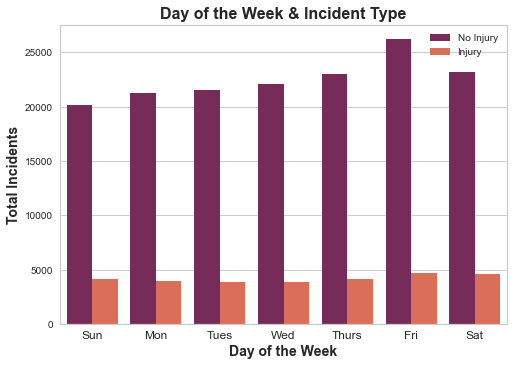

In [102]:
# plotting CRASH_DAY_OF_WEEK by incident type occurrence
sns.countplot(x='CRASH_DAY_OF_WEEK', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.xlabel('Day of the Week', weight='bold', size=14)
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xticks(ticks=[0,1,2,3,4,5,6], labels=['Sun','Mon','Tues','Wed','Thurs','Fri','Sat'], fontsize=12)
plt.title('Day of the Week & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury']);

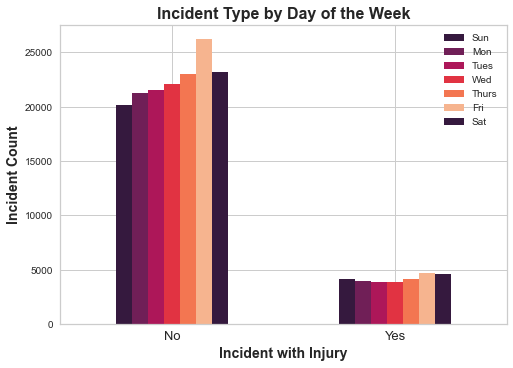

In [103]:
# plotting Incident Type grouped by Day of the Week
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','CRASH_DAY_OF_WEEK']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Day of the Week', weight='bold', size=16)
plt.legend(['Sun','Mon','Tues','Wed','Thurs','Fri','Sat']);

In [104]:
# confirming value types, percentages, and remaining nulls
df['CRASH_DAY_OF_WEEK'].value_counts(dropna=False, normalize=True)

6.0    0.165827
7.0    0.148600
5.0    0.145289
4.0    0.139175
3.0    0.136132
2.0    0.135028
1.0    0.129948
Name: CRASH_DAY_OF_WEEK, dtype: float64

In [105]:
# confirming dtype for one hot encoding in later pipeline  
df['CRASH_DAY_OF_WEEK'] = df['CRASH_DAY_OF_WEEK'].astype(object)
df['CRASH_DAY_OF_WEEK'].dtype

dtype('O')

#### CRASH_MONTH
 - "The month component of CRASH_DATE"

In [106]:
# checking column values and remaining nulls
df['CRASH_MONTH'].value_counts(dropna=False)

10.0    17511
7.0     16938
9.0     16849
8.0     16828
5.0     16748
6.0     16316
11.0    14847
4.0     14477
3.0     14472
12.0    14416
1.0     13804
2.0     13422
Name: CRASH_MONTH, dtype: int64

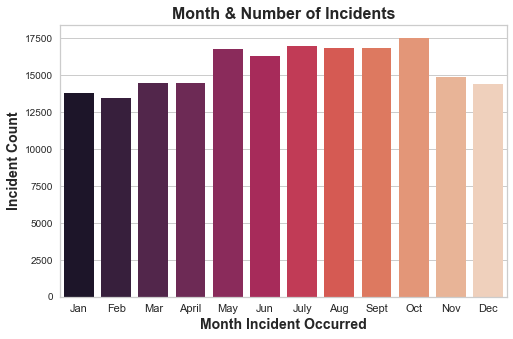

In [107]:
# plotting CRASH_MONTH by number of incidents
plt.figure(figsize=(8,5))
sns.countplot(x=df['CRASH_MONTH'], 
              data=df, 
              palette='rocket')
plt.xlabel('Month Incident Occurred', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11], labels=['Jan','Feb','Mar','April','May','Jun','July','Aug','Sept','Oct','Nov','Dec'], fontsize=11)
plt.title('Month & Number of Incidents', weight='bold', size=16)
plt.savefig('Month & Number of Incidents.jpg', dpi = 400);

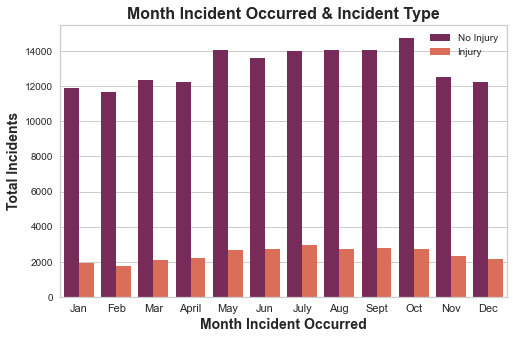

In [108]:
# plotting CRASH_MONTH by incident type occurrence
plt.figure(figsize=(8,5))
sns.countplot(x='CRASH_MONTH', 
              hue='Incident with Injury', 
              data=df, 
              palette='rocket')
plt.xlabel('Month Incident Occurred', weight='bold', size=14)
plt.ylabel('Total Incidents', weight='bold', size=14)
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11], labels=['Jan','Feb','Mar','April','May','Jun','July','Aug','Sept','Oct','Nov','Dec'], fontsize=11)
plt.title('Month Incident Occurred & Incident Type', weight='bold', size=16)
plt.legend(['No Injury','Injury'])
plt.savefig('Month Incident Occurred & Incident Type.jpg', dpi = 400);

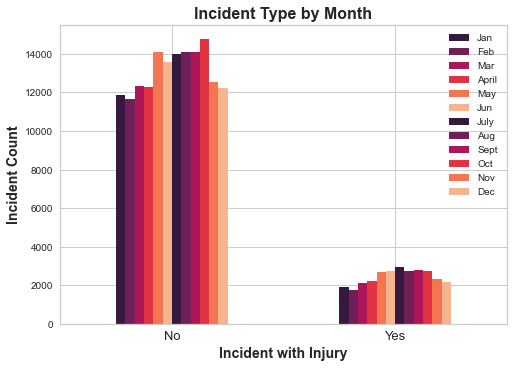

In [109]:
# plotting Incident Type grouped by CRASH_MONTH
sns.set_palette('rocket')
df_gb = df.groupby(['Incident with Injury','CRASH_MONTH']).size().unstack(level=1)
df_gb.plot(kind='bar')
plt.xlabel('Incident with Injury', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(ticks=[0,1], labels=['No','Yes'], rotation=360, fontsize=13)
plt.title('Incident Type by Month', weight='bold', size=16)
plt.legend(['Jan','Feb','Mar','April','May','Jun','July','Aug','Sept','Oct','Nov','Dec'])
plt.savefig('Incident Type by Month.jpg', dpi = 400);

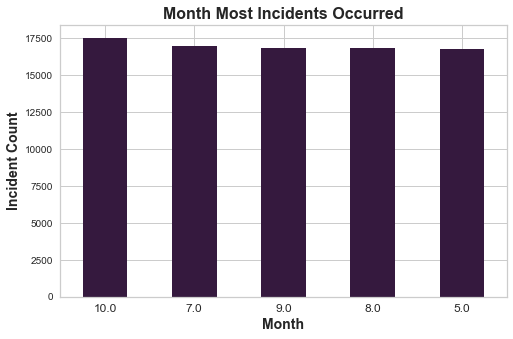

In [110]:
# bar plot of top 5 crash month values with most incidents 
sns.set_palette('rocket')
df['CRASH_MONTH'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Month', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=360, fontsize=12)
plt.title('Month Most Incidents Occurred', weight='bold', size=16)
plt.savefig('Month Most Incidents Occurred.jpg', dpi=400);

In [111]:
# confirming value types, percentages, and remaining nulls
df['CRASH_MONTH'].value_counts(dropna=False, normalize=True)

10.0    0.093828
7.0     0.090758
9.0     0.090281
8.0     0.090169
5.0     0.089740
6.0     0.087425
11.0    0.079554
4.0     0.077571
3.0     0.077545
12.0    0.077245
1.0     0.073965
2.0     0.071918
Name: CRASH_MONTH, dtype: float64

In [112]:
# confirming dtype for one hot encoding in later pipeline 
df['CRASH_MONTH'] = df['CRASH_MONTH'].astype(object)
df['CRASH_MONTH'].dtype

dtype('O')

#### MO_YEAR
 - Incident date, format: YYYY-MM-DD. Created this column from original date column to identify incidents from July 2021 - June 2022.

In [113]:
# checking column values and remaining nulls
df['MO_YEAR'].value_counts(dropna=False)

2021-10-29    861
2021-12-10    834
2021-09-17    786
2022-05-13    767
2022-05-06    712
2021-10-01    703
2021-10-08    689
2022-02-17    686
2022-06-17    676
2021-09-10    674
2021-09-24    663
2021-10-28    660
2022-06-14    660
2022-03-18    657
2021-08-21    656
2021-10-07    655
2021-11-05    653
2021-11-12    653
2022-06-03    649
2021-08-14    647
2021-07-30    642
2021-07-29    642
2021-07-24    639
2022-06-16    639
2021-09-16    639
2021-10-02    634
2022-04-23    631
2022-01-28    629
2022-06-10    629
2021-10-30    628
2021-08-27    627
2021-12-05    626
2021-10-24    625
2021-11-19    623
2022-06-24    622
2021-09-01    621
2021-09-15    619
2022-04-29    618
2021-08-01    616
2021-07-06    615
2022-05-03    614
2021-09-03    612
2022-05-07    611
2022-02-05    610
2022-04-30    609
2021-07-02    606
2021-08-28    604
2022-05-05    603
2022-04-01    602
2021-07-09    602
2021-09-08    599
2021-07-04    599
2022-06-15    597
2021-07-28    594
2021-08-29    593
2021-07-03

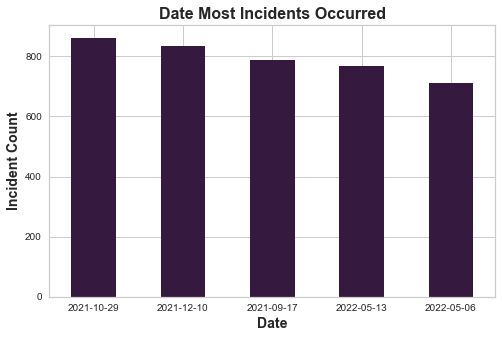

In [114]:
# bar plot of top 5 date values with most incidents 
sns.set_palette('rocket')
df['MO_YEAR'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Date', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=360)
plt.title('Date Most Incidents Occurred', weight='bold', size=16);

In [115]:
# dropping column since it was created to identify incidents from July 2021 - June 2022. keeping month, day, and hour columns.
df = df.drop(['MO_YEAR'], axis=1)
df.shape

(186628, 26)

#### STREET_NAME
 - "Street address name of crash location, as determined by reporting officer"

In [116]:
# checking column values and remaining nulls
df['STREET_NAME'].value_counts(dropna=False)

WESTERN AVE                    5304
CICERO AVE                     4617
PULASKI RD                     4383
ASHLAND AVE                    4245
HALSTED ST                     3897
KEDZIE AVE                     3406
NORTH AVE                      2278
MICHIGAN AVE                   2144
STATE ST                       2044
IRVING PARK RD                 1972
CALIFORNIA AVE                 1928
STONY ISLAND AVE               1926
ARCHER AVE                     1900
FULLERTON AVE                  1888
CENTRAL AVE                    1869
BELMONT AVE                    1868
DAMEN AVE                      1868
GRAND AVE                      1813
CLARK ST                       1769
63RD ST                        1756
87TH ST                        1756
ROOSEVELT RD                   1608
79TH ST                        1585
ADDISON ST                     1564
COTTAGE GROVE AVE              1542
CHICAGO AVE                    1504
LAKE SHORE DR SB               1484
47TH ST                     

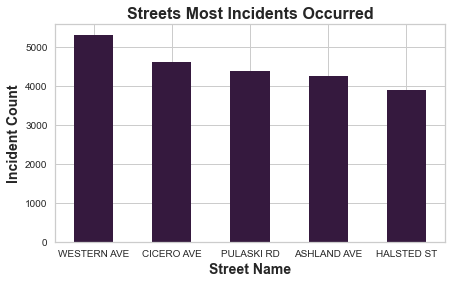

In [117]:
# bar plot of top 5 street name values with most incidents 
sns.set_palette('rocket')
df['STREET_NAME'].value_counts().head(5).plot(kind ='bar', figsize=(7,4))
plt.xlabel('Street Name', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=360)
plt.title('Streets Most Incidents Occurred', weight='bold', size=16);

In [118]:
# dropping column for redundancy in location. will keep 'location' column. 
df.drop('STREET_NAME', axis=1, inplace=True)
df.shape

(186628, 25)

#### LATITUDE
 - "The latitude of the crash location, as determined by reporting officer, as derived from the reported address of crash"

In [119]:
# checking column values and remaining nulls
df['LATITUDE'].value_counts(dropna=False)

NaN          1519
41.976201     413
41.791420     162
41.900959     158
41.751461     109
41.722257     101
41.926161      88
41.896805      85
41.880856      83
41.736209      76
41.754660      76
41.778335      73
41.736165      69
41.878310      65
41.663182      62
41.751612      62
41.900753      57
41.773368      57
41.851288      55
41.807530      54
41.749724      53
41.736380      52
41.736823      52
41.714119      52
41.765928      51
41.816729      50
41.789329      50
41.808378      50
41.751340      50
41.985641      48
41.962027      48
41.785643      48
41.659126      47
41.867446      46
41.756897      46
41.808047      46
41.772615      45
41.940443      45
41.773439      45
41.764292      45
41.789339      44
41.818178      44
41.736262      43
41.793371      43
41.677721      43
41.810592      42
41.896828      42
41.931021      42
41.764008      42
41.736145      42
41.721365      42
41.773293      42
41.758069      41
41.909765      41
41.744152      41
41.892094 

In [120]:
# dropping column for redundancy in location. will keep 'location' column. 
df.drop('LATITUDE', axis=1, inplace=True)
df.shape

(186628, 24)

#### LONGITUDE
 - "The longitude of the crash location, as determined by reporting officer, as derived from the reported address of crash"

In [121]:
df['LONGITUDE'].value_counts(dropna=False)

 NaN          1519
-87.905309     413
-87.580148     162
-87.619928     158
-87.585972     109
-87.585276     101
-87.631515      88
-87.617027      85
-87.617636      83
-87.741385      76
-87.624306      76
-87.742436      73
-87.625588      69
-87.617576      65
-87.641565      62
-87.585592      62
-87.576639      57
-87.624235      57
-87.723851      55
-87.743297      54
-87.702540      53
-87.643145      52
-87.585783      52
-87.627509      52
-87.586470      51
-87.741646      50
-87.743537      50
-87.684571      50
-87.585632      50
-87.646640      48
-87.655389      48
-87.741486      48
-87.559433      47
-87.704119      46
-87.618904      46
-87.586234      46
-87.741753      45
-87.630100      45
-87.566899      45
-87.638634      45
-87.741353      44
-87.743612      44
-87.684175      43
-87.629065      43
-87.642052      43
-87.589371      42
-87.643358      42
-87.676864      42
-87.586442      42
-87.626918      42
-87.617208      42
-87.722499      42
-87.625050  

In [122]:
# dropping column for redundancy in location. will keep 'location' column. 
df.drop('LONGITUDE', axis=1, inplace=True)
df.shape

(186628, 23)

#### LOCATION
 - "The crash location, as determined by reporting officer, as derived from the reported address of crash, in a column type that allows for mapping and other geographic analysis in the data portal software"

In [123]:
df['LOCATION'].value_counts(dropna=False, normalize=True)

NaN                                         0.008139
POINT (-87.905309125103 41.976201139024)    0.002213
POINT (-87.580147768689 41.791420282098)    0.000868
POINT (-87.619928173678 41.900958919109)    0.000847
POINT (-87.585971992965 41.751460603167)    0.000584
POINT (-87.585275565077 41.722257273006)    0.000541
POINT (-87.631514664826 41.926160719812)    0.000472
POINT (-87.617027423234 41.896804972416)    0.000455
POINT (-87.617635891755 41.880856047671)    0.000445
POINT (-87.624305519124 41.736209469449)    0.000407
POINT (-87.741384758605 41.754660124394)    0.000407
POINT (-87.74243649416 41.778335390453)     0.000391
POINT (-87.625587568999 41.736165110086)    0.000370
POINT (-87.617575903416 41.878310134581)    0.000348
POINT (-87.641565265157 41.663182101231)    0.000332
POINT (-87.585592284288 41.751611523273)    0.000332
POINT (-87.576638552177 41.773368408547)    0.000305
POINT (-87.62423499978 41.900752974042)     0.000305
POINT (-87.723850843329 41.851288488406)    0.

In [124]:
# dropping location nulls, less than 1%. 
df = df.dropna(subset=['LOCATION']).copy()
print(df.shape)

(185109, 23)


In [192]:
# creating labels of top 5 location values with most incidents 
labels = df['LOCATION'].value_counts().head(5).keys()
labels

Index(['POINT (-87.905309125103 41.976201139024)',
       'POINT (-87.580147768689 41.791420282098)',
       'POINT (-87.619928173678 41.900958919109)',
       'POINT (-87.585971992965 41.751460603167)',
       'POINT (-87.585275565077 41.722257273006)'],
      dtype='object')

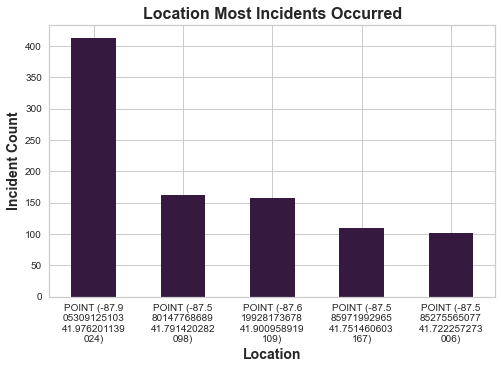

In [172]:
# adding line break to location value labels to better fit in plot
labels = ['\n'.join(wrap(x, 12)) for x in labels]
# bar plot of top 5 location values with most incidents 
sns.set_palette('rocket')
df['LOCATION'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Location', weight='bold', fontsize=14)
plt.xticks([0,1,2,3,4], labels, rotation=0)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.title('Location Most Incidents Occurred', weight='bold', size=16)
plt.savefig('Location Most Incidents Occurred.jpg', dpi = 400);

In [126]:
# confirming dtype for one hot encoding and imputing in later pipeline 
df['LOCATION'] = df['LOCATION'].astype(object)
df['LOCATION'].dtype

dtype('O')

#### UNIT_TYPE
 - "The type of unit"

In [127]:
df['UNIT_TYPE'].value_counts(dropna=False, normalize=True)

DRIVER                 0.803224
PARKED                 0.155730
NaN                    0.033850
DRIVERLESS             0.006969
DISABLED VEHICLE       0.000173
NON-CONTACT VEHICLE    0.000054
Name: UNIT_TYPE, dtype: float64

In [128]:
# dropping column for redundancy. each vehicle involved is accounted for through unique unit id which has been filtered through.
df.drop('UNIT_TYPE', axis=1, inplace=True)
df.shape

(185109, 22)

#### MAKE
 - "The make (brand) of the vehicle, if relevant"

In [129]:
# checking column values and remaining nulls
df['MAKE'].value_counts(dropna=False)

CHEVROLET                                                       22577
TOYOTA                                                          21088
FORD                                                            19392
NISSAN                                                          16050
HONDA                                                           15143
JEEP                                                             8856
HYUNDAI                                                          8843
DODGE                                                            8181
NaN                                                              6266
KIA                                                              5900
VOLKSWAGEN                                                       4020
GENERAL MOTORS CORPORATION (GMC)                                 3584
BUICK                                                            3257
CHRYSLER                                                         3190
LEXUS               

In [130]:
len(df['MAKE'].unique())

390

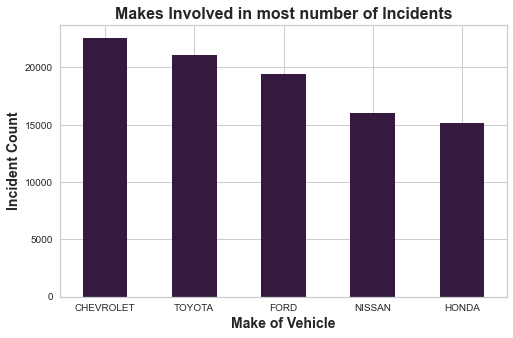

In [131]:
# bar plot of top 5 make values with most incidents 
sns.set_palette('rocket')
df['MAKE'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Make of Vehicle', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=360)
plt.title('Makes Involved in most number of Incidents', weight='bold', size=16);

In [132]:
# dropping column. 426 makes. many makes are not present more than once. the make could or could not have an effect, the larger representations of some makes could be due to varying reasons and will be looked at seperately.
df = df.drop(['MAKE'], axis=1)
df.shape

(185109, 21)

#### MODEL
 - "Traffic control device present at crash location, as determined by reporting officer"

In [133]:
# checking column values and remaining nulls
df['MODEL'].value_counts(dropna=False)

OTHER (EXPLAIN IN NARRATIVE)                          19769
NaN                                                    6266
CAMRY                                                  5781
COROLLA                                                4073
ALTIMA                                                 3995
CIVIC                                                  3906
MALIBU                                                 3640
ACCORD                                                 3293
ROGUE                                                  3078
CR-V                                                   2970
EQUINOX                                                2962
RAV4                                                   2903
SENTRA                                                 2859
EXPLORER                                               2595
IMPALA                                                 2528
ESCAPE                                                 2520
ELANTRA                                 

In [134]:
len(df['MODEL'].unique())

1318

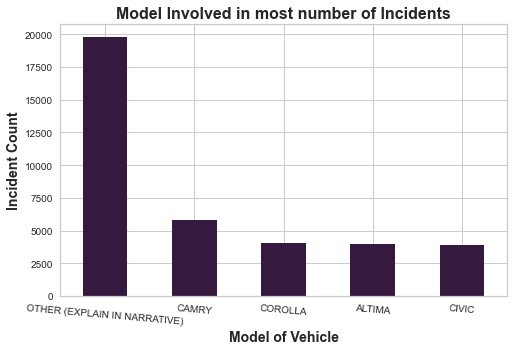

In [135]:
# bar plot of top 5 model values with most incidents 
sns.set_palette('rocket')
df['MODEL'].value_counts().head(5).plot(kind='bar', figsize=(8,5))
plt.xlabel('Model of Vehicle', weight='bold', fontsize=14)
plt.ylabel('Incident Count', weight='bold', fontsize=14)
plt.xticks(rotation=355)
plt.title('Model Involved in most number of Incidents', weight='bold', size=16);

In [136]:
# dropping column. 1382 models. many models are not present more than once. the model could or could not have an effect, the larger representations of some models could be due to varying reasons and will be looked at seperately.
# lots of 'other' values where make was confirmed. in the future can explore the narrative to find out why model is not specified even when make was specified.
df = df.drop(['MODEL'], axis=1)
df.shape

(185109, 20)

#### VEHICLE_YEAR
 - "The model year of the vehicle, if relevant"

In [137]:
# checking column values and remaining nulls
df['VEHICLE_YEAR'].value_counts(dropna=False)

2017.0    13268
2018.0    12135
2015.0    11940
2016.0    11709
2019.0    11203
2014.0    10503
2020.0    10479
2013.0    10007
2021.0     8922
2012.0     8705
2008.0     8025
2011.0     7841
2007.0     7730
2010.0     6865
2006.0     6347
NaN        6266
2009.0     5647
2005.0     5315
2004.0     4466
2003.0     3696
2002.0     2968
2022.0     2587
2001.0     2212
2000.0     1846
1999.0     1288
1998.0      851
1997.0      644
1996.0      335
1995.0      295
1994.0      204
1993.0      133
1992.0       84
1990.0       55
2023.0       53
1989.0       51
1991.0       50
1900.0       49
1988.0       48
1987.0       36
1985.0       25
1984.0       21
9999.0       18
1986.0       17
1978.0       14
1901.0        7
1983.0        7
1979.0        6
2206.0        6
1970.0        6
1982.0        6
1981.0        6
1963.0        5
2028.0        4
1975.0        4
2207.0        4
2121.0        4
2088.0        4
1972.0        4
1974.0        4
1964.0        3
2100.0        3
1973.0        3
1969.0  

In [138]:
# dropping column. many years are not present more than once and/or not actual years.
df = df.drop(['VEHICLE_YEAR'], axis=1)
df.shape

(185109, 19)

#### VEHICLE_DEFECT
 - "Vehicle defects"

In [139]:
# checking column values and remaining nulls
df['VEHICLE_DEFECT'].value_counts(dropna=False, normalize=True)

NONE                0.537386
UNKNOWN             0.419639
NaN                 0.033850
OTHER               0.003787
BRAKES              0.003285
STEERING            0.000589
TIRES               0.000583
WHEELS              0.000330
SUSPENSION          0.000205
ENGINE/MOTOR        0.000146
FUEL SYSTEM         0.000054
SIGNALS             0.000032
CARGO               0.000027
WINDOWS             0.000027
LIGHTS              0.000027
EXHAUST             0.000022
RESTRAINT SYSTEM    0.000005
TRAILER COUPLING    0.000005
Name: VEHICLE_DEFECT, dtype: float64

In [140]:
# dropping column. over 45% of the data is unknown, NaN, or other
df = df.drop(['VEHICLE_DEFECT'], axis=1)
df.shape

(185109, 18)

#### VEHICLE_TYPE
 - "The type of vehicle, if relevant"

In [141]:
# checking column values and remaining nulls
df['VEHICLE_TYPE'].value_counts(dropna=False, normalize=True)

PASSENGER                               0.649050
SPORT UTILITY VEHICLE (SUV)             0.157545
VAN/MINI-VAN                            0.044061
NaN                                     0.033850
PICKUP                                  0.033823
UNKNOWN/NA                              0.028978
TRUCK - SINGLE UNIT                     0.015710
OTHER                                   0.009967
BUS OVER 15 PASS.                       0.009135
TRACTOR W/ SEMI-TRAILER                 0.007790
BUS UP TO 15 PASS.                      0.003625
MOTORCYCLE (OVER 150CC)                 0.002307
SINGLE UNIT TRUCK WITH TRAILER          0.001691
TRACTOR W/O SEMI-TRAILER                0.001016
OTHER VEHICLE WITH TRAILER              0.000897
MOPED OR MOTORIZED BICYCLE              0.000308
3-WHEELED MOTORCYCLE (2 REAR WHEELS)    0.000081
AUTOCYCLE                               0.000065
ALL-TERRAIN VEHICLE (ATV)               0.000054
FARM EQUIPMENT                          0.000043
MOTOR DRIVEN CYCLE  

In [142]:
# defining dictionary map and mapping dictionary on column
vehicle_map = {'PASSENGER': 'PASSENGER',
               'SPORT UTILITY VEHICLE (SUV)': 'SUV/VAN', 
               'VAN/MINI-VAN': 'SUV/VAN',
               'PICKUP': 'TRUCK',
                np.nan:'UNKNOWN/NA',
               'UNKNOWN/NA': 'UNKNOWN/NA',
               'TRUCK - SINGLE UNIT': 'TRUCK',
               'OTHER': 'OTHER',
               'BUS OVER 15 PASS.': 'BUS',
               'TRACTOR W/ SEMI-TRAILER': 'SEMI',
               'BUS UP TO 15 PASS.': 'BUS',
               'MOTORCYCLE (OVER 150CC)': 'MOTORBIKE',
               'SINGLE UNIT TRUCK WITH TRAILER': 'VEHICLE W TRAILER',
               'TRACTOR W/O SEMI-TRAILER': 'TRACTOR',
               'OTHER VEHICLE WITH TRAILER': 'VEHICLE W TRAILER',
               'MOPED OR MOTORIZED BICYCLE': 'MOTORBIKE',
               '3-WHEELED MOTORCYCLE (2 REAR WHEELS)': 'MOTORBIKE',
               'AUTOCYCLE': 'MOTORBIKE',
               'ALL-TERRAIN VEHICLE (ATV)': 'OTHER',
               'FARM EQUIPMENT': 'OTHER',
               'RECREATIONAL OFF-HIGHWAY VEHICLE (ROV)': 'OTHER',
               'MOTOR DRIVEN CYCLE': 'MOTORBIKE'}

df['VEHICLE_TYPE'] = df['VEHICLE_TYPE'].map(vehicle_map)
df['VEHICLE_TYPE'].value_counts(dropna=False, normalize=True)

PASSENGER            0.649050
SUV/VAN              0.201606
UNKNOWN/NA           0.062828
TRUCK                0.049533
BUS                  0.012760
OTHER                0.010064
SEMI                 0.007790
MOTORBIKE            0.002766
VEHICLE W TRAILER    0.002588
TRACTOR              0.001016
Name: VEHICLE_TYPE, dtype: float64

#### VEHICLE_USE
 - "The normal use of the vehicle, if relevant"

In [143]:
# checking column values and remaining nulls
df['VEHICLE_USE'].value_counts(dropna=False, normalize=True)

PERSONAL                        0.698189
UNKNOWN/NA                      0.127249
NOT IN USE                      0.060251
NaN                             0.033850
OTHER                           0.029945
COMMERCIAL - SINGLE UNIT        0.010740
RIDESHARE SERVICE               0.006747
CTA                             0.006553
POLICE                          0.006029
TAXI/FOR HIRE                   0.005143
CONSTRUCTION/MAINTENANCE        0.003738
COMMERCIAL - MULTI-UNIT         0.003355
SCHOOL BUS                      0.002393
TOW TRUCK                       0.001858
AMBULANCE                       0.001134
DRIVER EDUCATION                0.000967
FIRE                            0.000718
STATE OWNED                     0.000686
LAWN CARE/LANDSCAPING           0.000303
AGRICULTURE                     0.000076
CAMPER/RV - SINGLE UNIT         0.000032
MILITARY                        0.000032
HOUSE TRAILER                   0.000005
CAMPER/RV - TOWED/MULTI-UNIT    0.000005
Name: VEHICLE_US

In [144]:
# dropping column. most values are personal/unknown/na/not in use/NaN/or other.  
df = df.drop(['VEHICLE_USE'], axis=1)
df.shape

(185109, 17)

#### MANEUVER
 - "The action the unit was taking prior to the crash, as determined by the reporting officer"

In [145]:
df['MANEUVER'].value_counts(dropna=False)

STRAIGHT AHEAD                        85425
PARKED                                29149
SLOW/STOP IN TRAFFIC                  14453
TURNING LEFT                          11730
BACKING                                6603
NaN                                    6266
TURNING RIGHT                          5994
UNKNOWN/NA                             5671
PASSING/OVERTAKING                     3751
OTHER                                  3122
CHANGING LANES                         3064
ENTERING TRAFFIC LANE FROM PARKING     2217
MERGING                                1208
STARTING IN TRAFFIC                    1135
U-TURN                                 1124
AVOIDING VEHICLES/OBJECTS               839
LEAVING TRAFFIC LANE TO PARK            803
SKIDDING/CONTROL LOSS                   682
PARKED IN TRAFFIC LANE                  623
ENTER FROM DRIVE/ALLEY                  613
DRIVING WRONG WAY                       277
NEGOTIATING A CURVE                     205
TURNING ON RED                  

In [146]:
# dropping column for redundancy in crash type information. will keep 'FIRST_CRASH_TYPE' column. 
df = df.drop(['MANEUVER'], axis=1)
df.shape

(185109, 16)

#### OCCUPANT_CNT
 - "The number of people in the unit, as determined by the reporting officer"

In [147]:
df['OCCUPANT_CNT'].value_counts(dropna=False, normalize=True)

1.0     0.662356
0.0     0.150792
2.0     0.108509
NaN     0.033850
3.0     0.028481
4.0     0.010497
5.0     0.003674
6.0     0.001016
7.0     0.000389
8.0     0.000173
11.0    0.000059
9.0     0.000049
10.0    0.000049
12.0    0.000027
13.0    0.000022
20.0    0.000016
18.0    0.000016
15.0    0.000005
16.0    0.000005
17.0    0.000005
25.0    0.000005
27.0    0.000005
Name: OCCUPANT_CNT, dtype: float64

In [148]:
# dropping column. most values are between 0-3 or NaN for occupant count.
df = df.drop(['OCCUPANT_CNT'], axis=1)
df.shape

(185109, 15)

#### FIRST_CONTACT_POINT
 - Type of first contact in crash

In [149]:
# checking column values and remaining nulls
df['FIRST_CONTACT_POINT'].value_counts(dropna=False)

OTHER                37961
REAR-LEFT            27125
TOTAL (ALL AREAS)    22230
FRONT                21361
ROOF                 14307
SIDE-RIGHT           12505
SIDE-LEFT            10020
UNKNOWN               7623
REAR                  7225
NaN                   6266
FRONT-LEFT            5994
REAR-RIGHT            4440
UNDER CARRIAGE        3808
FRONT-RIGHT           3196
NONE                  1048
Name: FIRST_CONTACT_POINT, dtype: int64

In [150]:
# dropping column due to redundancy. definition not provided, therefore not certain which car first contact point pertains to. 
df = df.drop(['FIRST_CONTACT_POINT'], axis=1)
df.shape

(185109, 14)

In [151]:
# viewing columns, # of columns, dtypes, # of rows, # of non nulls
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 185109 entries, 0 to 187035
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   TRAFFIC_CONTROL_DEVICE  185109 non-null  object
 1   DEVICE_CONDITION        185109 non-null  object
 2   WEATHER_CONDITION       185109 non-null  object
 3   LIGHTING_CONDITION      185109 non-null  object
 4   FIRST_CRASH_TYPE        185109 non-null  object
 5   TRAFFICWAY_TYPE         185109 non-null  object
 6   ROADWAY_SURFACE_COND    185109 non-null  object
 7   Incident with Injury    185109 non-null  int64 
 8   CRASH_HOUR              185109 non-null  object
 9   CRASH_DAY_OF_WEEK       185109 non-null  object
 10  CRASH_MONTH             185109 non-null  object
 11  LOCATION                185109 non-null  object
 12  VEHICLE_TYPE            185109 non-null  object
 13  SPEED_LIMIT             185109 non-null  object
dtypes: int64(1), object(13)
memory usage

In [152]:
# making new clean csv
df.to_csv('data/clean_chicago.csv', index=False)